In [13]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import tensorflow as tf
import matplotlib.pyplot as plt 
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score

from keras.layers import Dense,Dropout,LSTM, GRU, SimpleRNN
from keras.layers import TimeDistributed
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers import ConvLSTM2D
from keras.layers.convolutional import MaxPooling1D
from keras.models import Sequential
from keras.losses import mean_squared_error
from keras.backend import sign
import math

# Data Processing

In [3]:
data_df =  pd.read_csv("prices-split-adjusted.csv", index_col = 0)
data_df.head()

,symbol,open,close,low,high,volume
date,,,,,,
2016-01-05,WLTW,123.430000,125.839996,122.309998,126.250000,2163600.0
2016-01-06,WLTW,125.239998,119.980003,119.940002,125.540001,2386400.0
2016-01-07,WLTW,116.379997,114.949997,114.930000,119.739998,2489500.0
2016-01-08,WLTW,115.480003,116.620003,113.500000,117.440002,2006300.0
2016-01-11,WLTW,117.010002,114.970001,114.089996,117.330002,1408600.0


In [4]:
data_df = data_df[data_df.symbol == 'AAPL']
data_df.drop(['symbol'],1,inplace=True)
data_df.head()

/tmp/ipykernel_5565/1763401402.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  data_df.drop(['symbol'],1,inplace=True)


,open,close,low,high,volume
date,,,,,
2010-01-04,30.490000,30.572857,30.340000,30.642857,123432400.0
2010-01-05,30.657143,30.625713,30.464285,30.798571,150476200.0
2010-01-06,30.625713,30.138571,30.107143,30.747143,138040000.0
2010-01-07,30.250000,30.082857,29.864286,30.285715,119282800.0
2010-01-08,30.042856,30.282858,29.865715,30.285715,111902700.0


In [5]:
data_df.tail()

,open,close,low,high,volume
date,,,,,
2016-12-23,115.589996,116.519997,115.589996,116.519997,14249500.0
2016-12-27,116.519997,117.260002,116.489998,117.800003,18296900.0
2016-12-28,117.519997,116.760002,116.199997,118.019997,20905900.0
2016-12-29,116.449997,116.730003,116.400002,117.110001,15039500.0
2016-12-30,116.650002,115.820000,115.430000,117.199997,30586300.0


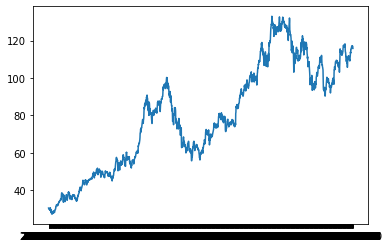

In [6]:
plt.plot(data_df['close'])
plt.show()

In [7]:
data_df['date'] = data_df.index
data_df.head()

,open,close,low,high,volume,date
date,,,,,,
2010-01-04,30.490000,30.572857,30.340000,30.642857,123432400.0,2010-01-04
2010-01-05,30.657143,30.625713,30.464285,30.798571,150476200.0,2010-01-05
2010-01-06,30.625713,30.138571,30.107143,30.747143,138040000.0,2010-01-06
2010-01-07,30.250000,30.082857,29.864286,30.285715,119282800.0,2010-01-07
2010-01-08,30.042856,30.282858,29.865715,30.285715,111902700.0,2010-01-08


In [8]:
data_df['date'] = pd.to_datetime(data_df['date'])

In [14]:
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))
dataset = min_max_scaler.fit_transform(data_df['close'].values.reshape(-1, 1))

In [16]:
# split into train and test sets
train_size = int(len(dataset) * 0.9)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
print(len(train), len(test))

1585 177


In [20]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=15):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

In [23]:
X_train, y_train = create_dataset(train, look_back=15)
X_test, y_test = create_dataset(test, look_back=15)
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
print(X_train.shape)
print(y_train.shape)
print(y_test.shape)

(1569, 1, 15)
(1569, 1, 15)
(1569,)
(161,)


# General Functions

In [24]:
def get_result(model, X_test, y_test, model_name="Test"): 
    print(f"Model - {model_name}:")
    
    predictions = model.predict(X_test)

    model_r2_score = r2_score(y_test, predictions)
    print("R^2 Score:",model_r2_score)
    predictions = predictions.reshape((predictions.shape[0]))
    print("RMSE:",  math.sqrt(mean_squared_error(y_test, predictions)))
    return model.predict(X_test)
def plot_predictions(test, predicted, title="Test", xLabel="Test", yLabel="Test", realLabel="Test", predictedLabel="Test"):
    plt.figure(figsize=(20,8))
    plt.rcParams.update({'font.size': 18})
    plt.plot(test, color='red',label=realLabel)
    plt.plot(predicted, alpha=0.7, color='blue',label=predictedLabel)
    plt.title(title)
    plt.xlabel(xLabel)
    plt.ylabel(yLabel)
    plt.legend()
    plt.show()

### Models in Functions

In [27]:
def lstm(X_train,y_train):
    # build LSTM model
    lstm_model = Sequential()

    lstm_model.add(LSTM(X_train.shape[1],return_sequences=False,activation="tanh", input_shape=(X_train.shape[1],15)))
    lstm_model.add(Dropout(0.15))
    # lstm_model.add(LSTM(10, return_sequences=False))
    # lstm_model.add(Dropout(0.2))

    lstm_model.add(Dense(1))

    lstm_model.summary()

    # train LSTM model
    lstm_model.compile(optimizer="adam",loss="MSE")
    lstm_model.fit(X_train, y_train, epochs=10)
    return lstm_model

In [9]:
def stacked_lstm(X_train,y_train):
# build Stacked_LSTM model
    s_lstm_model = Sequential()

    s_lstm_model.add(LSTM(X_train.shape[1],return_sequences=True,activation="tanh", input_shape=(X_train.shape[1],1)))
    s_lstm_model.add(Dropout(0.15))
    s_lstm_model.add(LSTM(15, return_sequences=False))
    s_lstm_model.add(Dropout(0.2))
    s_lstm_model.add(Dense(1))
    s_lstm_model.summary()

    s_lstm_model.compile(optimizer="adam",loss="MSE")
    s_lstm_model.fit(X_train, y_train, epochs=10)
    return s_lstm_model

In [10]:
def gru(X_train,y_train):
    # build GRU model
    gru_model = Sequential()

    gru_model.add(GRU(X_train.shape[1],activation="tanh", input_shape=(X_train.shape[1],1)))
    gru_model.add(Dropout(0.15))

    gru_model.add(Dense(1))

    gru_model.summary()

    gru_model.compile(optimizer="adam",loss="MSE")
    gru_model.fit(X_train, y_train, epochs=10)
    return gru_model

In [11]:
def rnn(X_train,y_train):
    rnn_model = Sequential()

    rnn_model.add(SimpleRNN(X_train.shape[1],activation="tanh", input_shape=(X_train.shape[1],1)))
    rnn_model.add(Dropout(0.15))

    rnn_model.add(Dense(1))

    rnn_model.summary()

    rnn_model.compile(optimizer="adam",loss="MSE")
    rnn_model.fit(X_train, y_train, epochs=10)
    return rnn_model


In [12]:
def cnn(X_train,y_train):
    cnn_model = Sequential()
    cnn_model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1],1)))
    cnn_model.add(MaxPooling1D(pool_size=2))
    cnn_model.add(Flatten())
    cnn_model.add(Dense(10, activation='relu'))
    cnn_model.add(Dense(1))
    cnn_model.summary()
    cnn_model.compile(optimizer='adam', loss='mse')



    cnn_model.compile(optimizer="adam",loss="MSE")
    cnn_model.fit(X_train, y_train, epochs=10)
    return cnn_model

In [13]:
def cnn_lstm(X_train,y_train):
    n_seq = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, X_train.shape[1], 1))

    cnn_lstm_model = Sequential()
    cnn_lstm_model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, X_train.shape[1],1)))
    cnn_lstm_model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
    cnn_lstm_model.add(TimeDistributed(Flatten()))
    cnn_lstm_model.add(LSTM(20, activation='relu'))
    cnn_lstm_model.add(Dense(1))

    cnn_lstm_model.summary()
    cnn_lstm_model.compile(optimizer='adam', loss='mse')


    cnn_lstm_model.compile(optimizer="adam",loss="MSE")
    cnn_lstm_model.fit(X_train_reshaped, y_train, epochs=10)
    return cnn_lstm_model

In [14]:
def convlstm(X_train,y_train):
    n_seq = 1
    n_features = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, 1, X_train.shape[1], n_features))

    conv_lstm_model = Sequential()
    conv_lstm_model.add(ConvLSTM2D(filters=64, kernel_size=(1,2), activation='relu', input_shape=(n_seq, 1, X_train.shape[1], n_features)))
    conv_lstm_model.add(Flatten())
    conv_lstm_model.add(Dense(1))
    conv_lstm_model.summary()

    conv_lstm_model.compile(optimizer="adam",loss="MSE")
    conv_lstm_model.fit(X_train_reshaped, y_train, epochs=10)
    return conv_lstm_model


# Training and fitting models

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 1)                 68        
                                                                 
 dropout_1 (Dropout)         (None, 1)                 0         
                                                                 
 dense_1 (Dense)             (None, 1)                 2         
                                                                 
Total params: 70
Trainable params: 70
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
50/50 [==============================] - 2s 2ms/step - loss: 0.2800
Epoch 2/10
50/50 [==============================] - 0s 2ms/step - loss: 0.2297
Epoch 3/10
50/50 [==============================] - 0s 2ms/step - loss: 0.1924
Epoch 4/10
50/50 [==============================] - 0s 2ms/step - loss: 0.1563
Epoch 

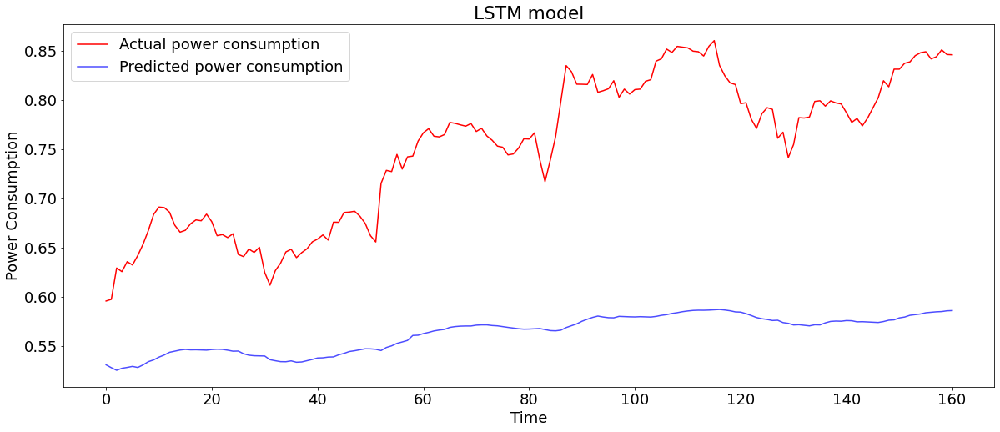

In [28]:
# build LSTM model
lstm_model=lstm(X_train,y_train)
lstm_predictions = get_result(lstm_model, X_test, y_test, "LSTM")
plot_predictions(y_test, lstm_predictions, "LSTM model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 23)                2300      
                                                                 
 dropout (Dropout)           (None, 23)                0         
                                                                 
 dense (Dense)               (None, 1)                 24        
                                                                 
Total params: 2,324
Trainable params: 2,324
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
127/127 [==============================] - 2s 6ms/step - loss: 0.0199
Epoch 2/10
127/127 [==============================] - 1s 6ms/step - loss: 0.0113
Epoch 3/10
127/127 [==============================] - 1s 7ms/step - loss: 0.0086
Epoch 4/10
127/127 [==============================] - 1s 6ms/step - loss: 0

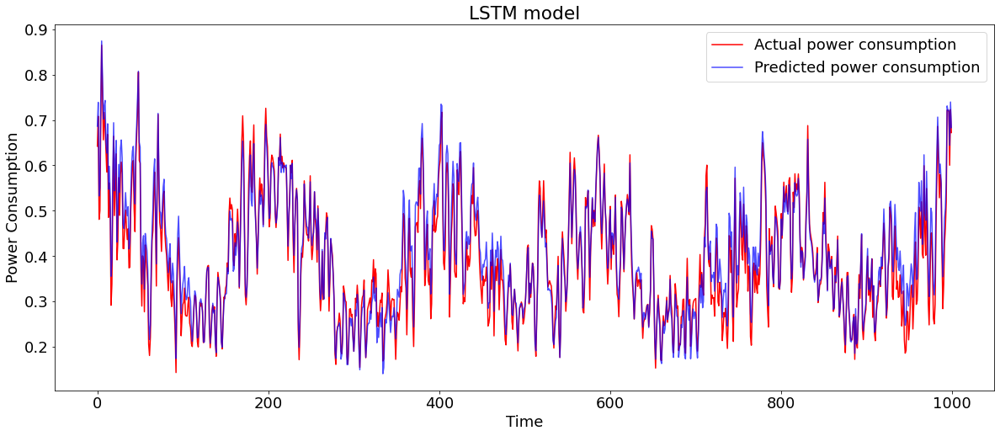

In [15]:
# build LSTM model
lstm_model=lstm(X_train,y_train)
lstm_predictions = get_result(lstm_model, X_test, y_test, "LSTM")
plot_predictions(y_test, lstm_predictions, "LSTM model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 23, 23)            2300      
                                                                 
 dropout_1 (Dropout)         (None, 23, 23)            0         
                                                                 
 lstm_2 (LSTM)               (None, 15)                2340      
                                                                 
 dropout_2 (Dropout)         (None, 15)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 16        
                                                                 
Total params: 4,656
Trainable params: 4,656
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
127/127 [==============================] 

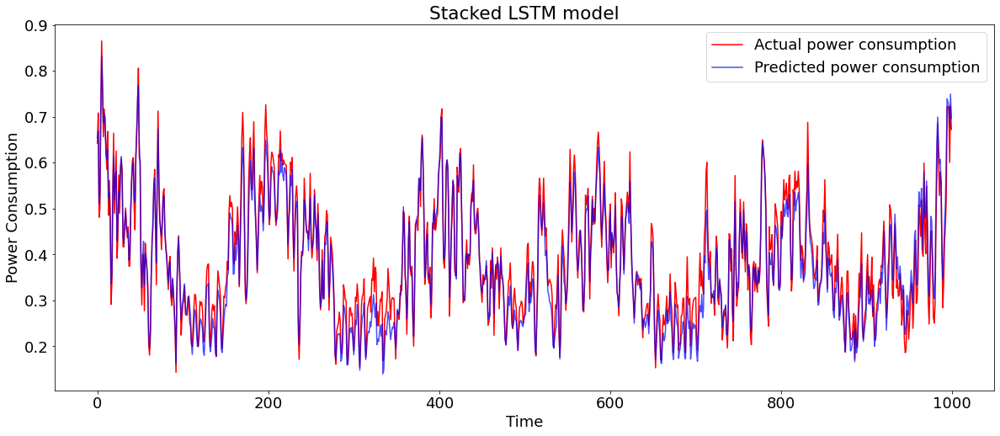

In [16]:
# build Stacked_LSTM model
s_lstm_model = stacked_lstm(X_train,y_train)


s_lstm_predictions = get_result(s_lstm_model, X_test, y_test, "Stacked LSTM")
plot_predictions(y_test, s_lstm_predictions, "Stacked LSTM model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 23)                1794      
                                                                 
 dropout_3 (Dropout)         (None, 23)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 24        
                                                                 
Total params: 1,818
Trainable params: 1,818
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
127/127 [==============================] - 2s 7ms/step - loss: 0.0460
Epoch 2/10
127/127 [==============================] - 1s 6ms/step - loss: 0.0107
Epoch 3/10
127/127 [==============================] - 1s 6ms/step - loss: 0.0068
Epoch 4/10
127/127 [==============================] - 1s 7ms/step - loss:

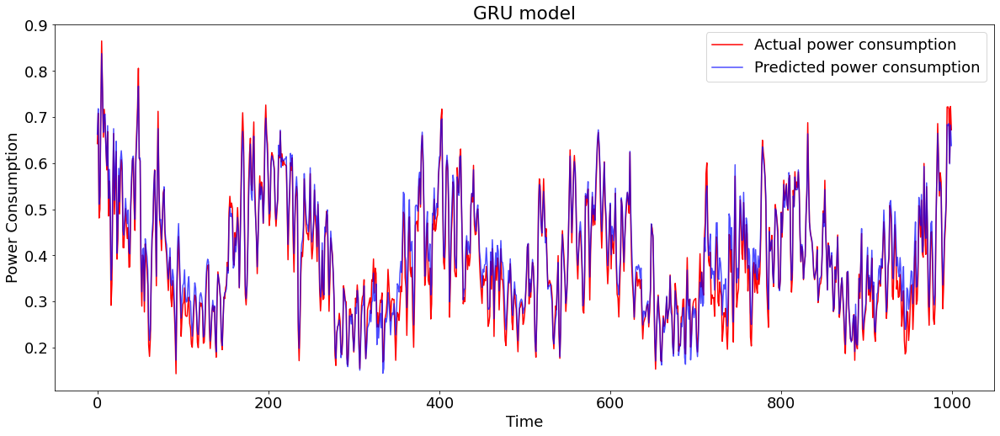

In [17]:
gru_model=gru(X_train,y_train)
gru_predictions = get_result(gru_model, X_test, y_test, "GRU")
plot_predictions(y_test, gru_predictions, "GRU model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 23)                575       
                                                                 
 dropout_4 (Dropout)         (None, 23)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 24        
                                                                 
Total params: 599
Trainable params: 599
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
127/127 [==============================] - 1s 3ms/step - loss: 0.0650
Epoch 2/10
127/127 [==============================] - 0s 3ms/step - loss: 0.0097
Epoch 3/10
127/127 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 4/10
127/127 [==============================] - 0s 3ms/step - loss: 0.0

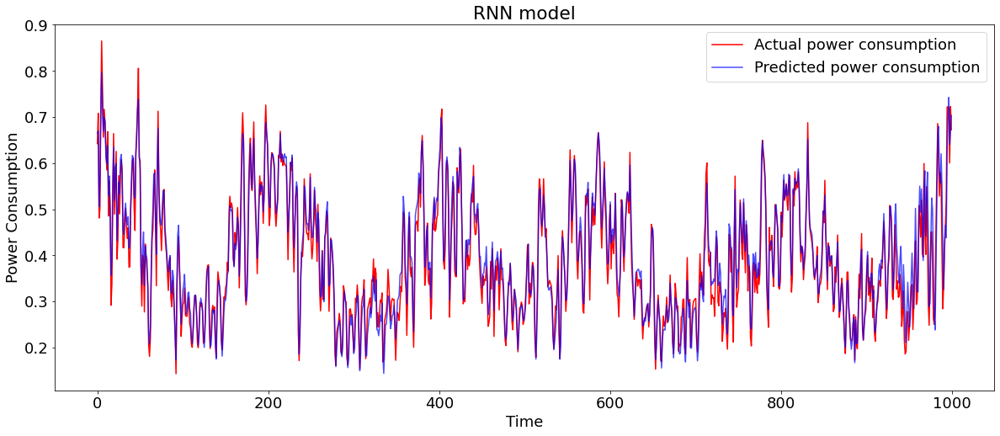

In [18]:
# build RNN model
rnn_model=rnn(X_train,y_train)
rnn_predictions = get_result(rnn_model, X_test, y_test, "RNN")
plot_predictions(y_test, rnn_predictions, "RNN model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 22, 64)            192       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 11, 64)           0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 704)               0         
                                                                 
 dense_4 (Dense)             (None, 10)                7050      
                                                                 
 dense_5 (Dense)             (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
____________________________________________________

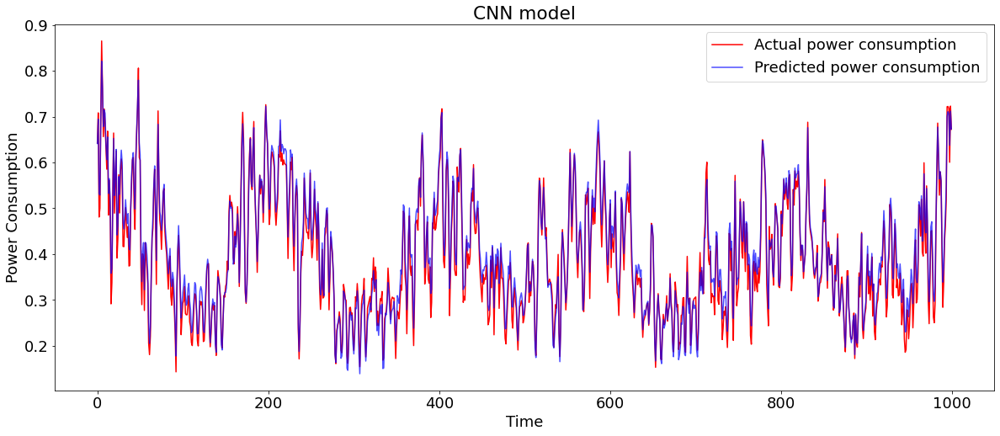

In [19]:
# build CNN model
 

cnn_model=cnn(X_train,y_train)
cnn_predictions = get_result(cnn_model, X_test, y_test, "CNN")
plot_predictions(y_test, cnn_predictions, "CNN model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, None, 23, 64)     128       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_3 (LSTM)               (None, 20)                58000     
                                                                 
 dense_6 (Dense)             (None, 1)                 21        
                                                      

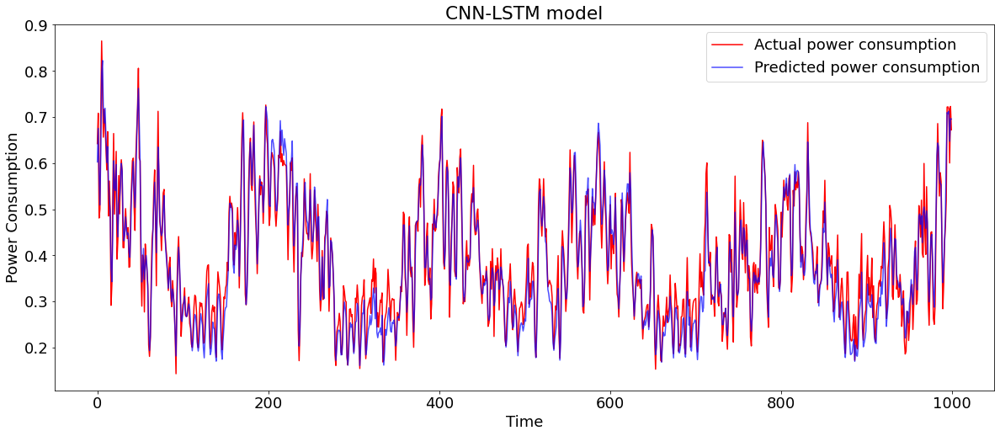

In [20]:
# build CNN-LSTM model
n_seq=1
cnn_lstm_model=cnn_lstm(X_train,y_train)
cnn_lstm_predictions = get_result(cnn_lstm_model, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnn_lstm_predictions, "CNN-LSTM model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 22, 64)         33536     
                                                                 
 flatten_2 (Flatten)         (None, 1408)              0         
                                                                 
 dense_7 (Dense)             (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
127/127 [==============================] - 2s 5ms/step - loss: 0.0307
Epoch 2/10
127/127 [==============================] - 1s 4ms/step - loss: 0.0066
Epoch 3/10
127/127 [==============================] - 1s 4ms/step - loss: 0.0031
Epoch 4/10
127/127 [==============================] - 1s 5ms/step - los

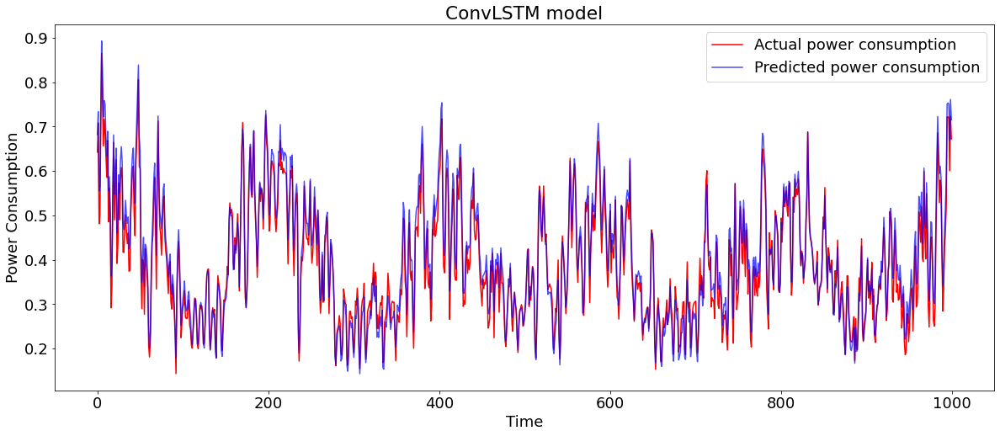

In [21]:
# build ConvLSTM model
n_seq=1
n_features = 1
conv_lstm_model=convlstm(X_train,y_train)

conv_lstm_predictions = get_result(conv_lstm_model, X_test.reshape((X_test.shape[0], n_seq, 1, X_test.shape[1], n_features)), y_test, "ConvLSTM")
plot_predictions(y_test, conv_lstm_predictions, "ConvLSTM model", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


# Adversarial Attacks

## Attack Functions

In [22]:
def signed_gradient(X_test, y): 
    X_tf = tf.convert_to_tensor(X_test, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(X_tf)
        lossFunction = mean_squared_error(X_tf, y.reshape(-1))
    gradientFunction = tape.gradient(lossFunction, X_tf)
    signed_grad = tf.sign(gradientFunction)
    return signed_grad.numpy()

def fgsm(X_test, y, epsilon=0.1):
    signed_grad = signed_gradient(X_test, y)
    X_perturbed = X_test + epsilon * signed_grad
    return X_perturbed

def bim(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test.copy()
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
       
        return X_perturbed
def pgd(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test + np.random.uniform(-epsilon,epsilon,X_test.shape)
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
        
        
        return X_perturbed

## Attacks on Models

### Attacks on LSTM

Model - FGSM perturbed LSTM:
R^2 Score: 0.42881447159977815
RMSE: 0.09634224446314697


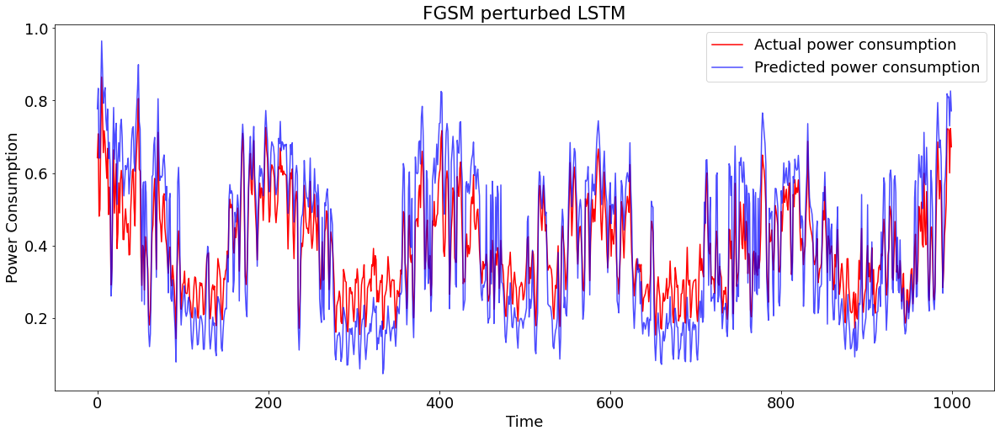

In [23]:
X_fgsm_perturbed_lstm = fgsm(X_test, y_test, epsilon=0.1) 
fgsm_predictions_lstm = get_result(lstm_model, X_fgsm_perturbed_lstm, y_test, "FGSM perturbed LSTM")
plot_predictions(y_test, fgsm_predictions_lstm, "FGSM perturbed LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [24]:
# run this to show intermediate results
# bim(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only = False)

Model - BIM perturbed LSTM:
R^2 Score: 0.8054177761555531
RMSE: 0.0562315113259826


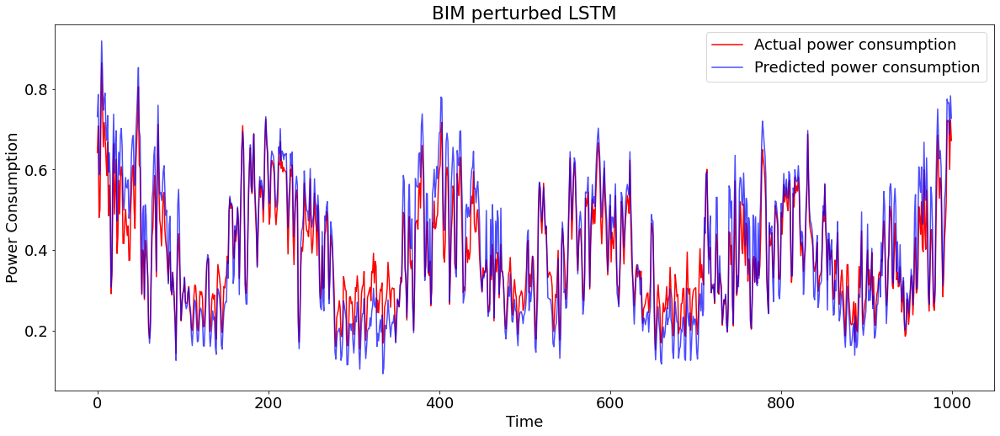

In [25]:

X_bim_perturbed_lstm = bim(5, 0.1, 0.05, X_test, y_test)
bim_predictions_lstm = get_result(lstm_model, X_bim_perturbed_lstm, y_test, "BIM perturbed LSTM")
plot_predictions(y_test, bim_predictions_lstm, "BIM perturbed LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


In [26]:
# run this to show intermediate results
# pgd(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only =False)

Model - PGD perturbed LSTM:
R^2 Score: 0.7384658471509854
RMSE: 0.06519170796284929


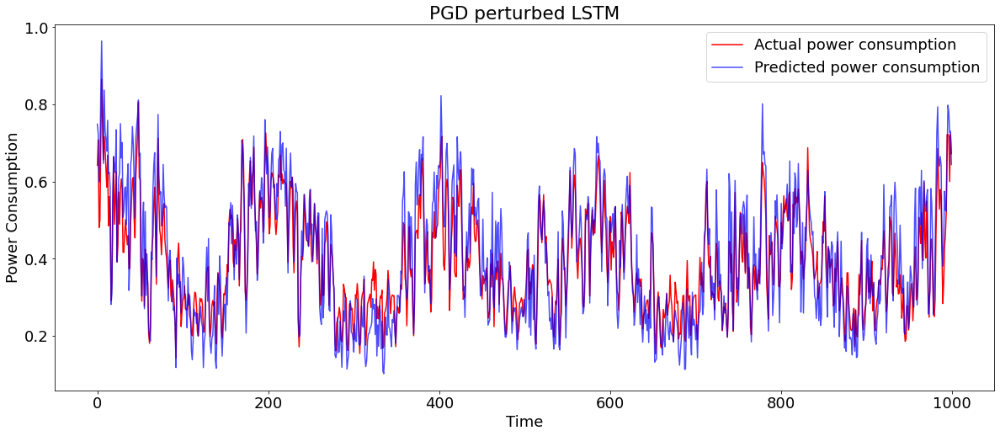

In [27]:
X_pgd_perturbed_lstm = pgd(5, 0.1, 0.05, X_test, y_test)
pgd_predictions_lstm = get_result(lstm_model, X_pgd_perturbed_lstm, y_test, "PGD perturbed LSTM")
plot_predictions(y_test, pgd_predictions_lstm, "PGD perturbed LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

### Attacks on Stacked LSTM

In [28]:
# need to copy the same things above
# replace the variable names carefully


Model - FGSM perturbed Stacked LSTM:
R^2 Score: 0.5474608713796438
RMSE: 0.08575436195019955


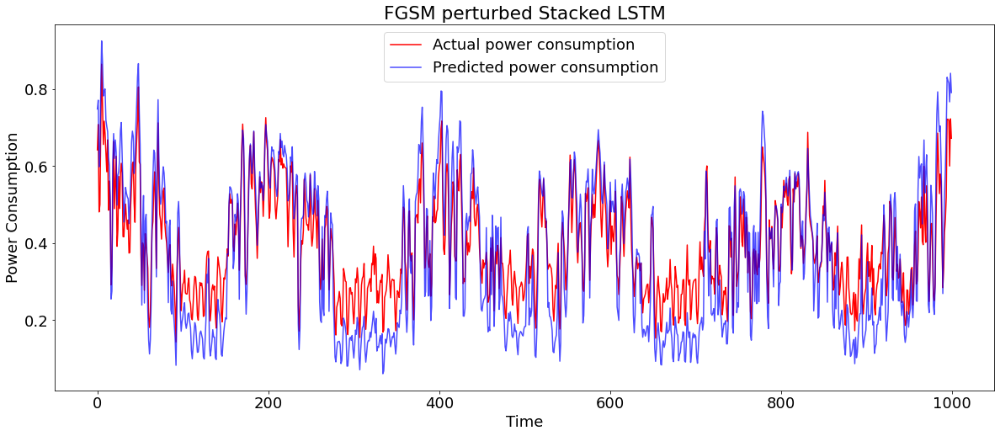

In [29]:
X_fgsm_perturbed_stlstm = fgsm(X_test, y_test, epsilon=0.1) 
fgsm_predictions_stlstm = get_result(s_lstm_model, X_fgsm_perturbed_stlstm, y_test, "FGSM perturbed Stacked LSTM")
plot_predictions(y_test, fgsm_predictions_stlstm, "FGSM perturbed Stacked LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM perturbed Stacked LSTM:
R^2 Score: 0.8263859181103446
RMSE: 0.05311542172196388


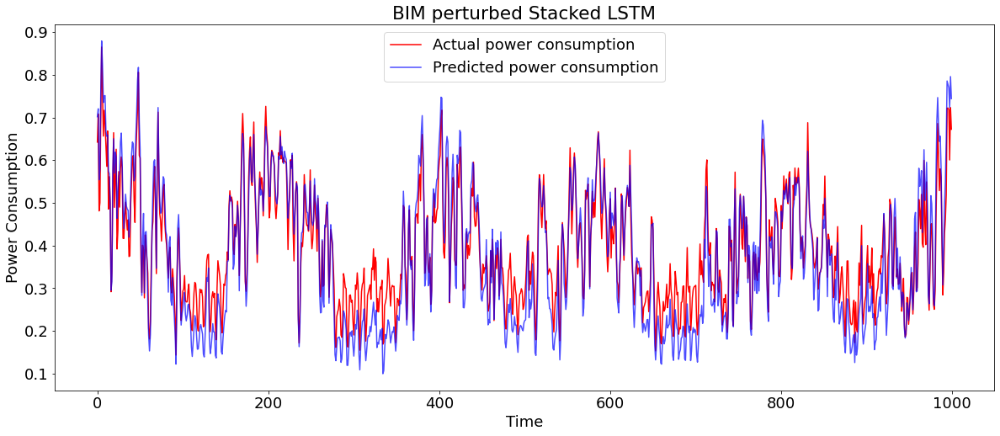

In [30]:

X_bim_perturbed_stlstm = bim(5, 0.1, 0.05, X_test, y_test)
bim_predictions_stlstm = get_result(s_lstm_model, X_bim_perturbed_stlstm, y_test, "BIM perturbed Stacked LSTM")
plot_predictions(y_test, bim_predictions_stlstm, "BIM perturbed Stacked LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model - PGD perturbed Stacked LSTM:
R^2 Score: 0.8065604386560906
RMSE: 0.056066158745819446


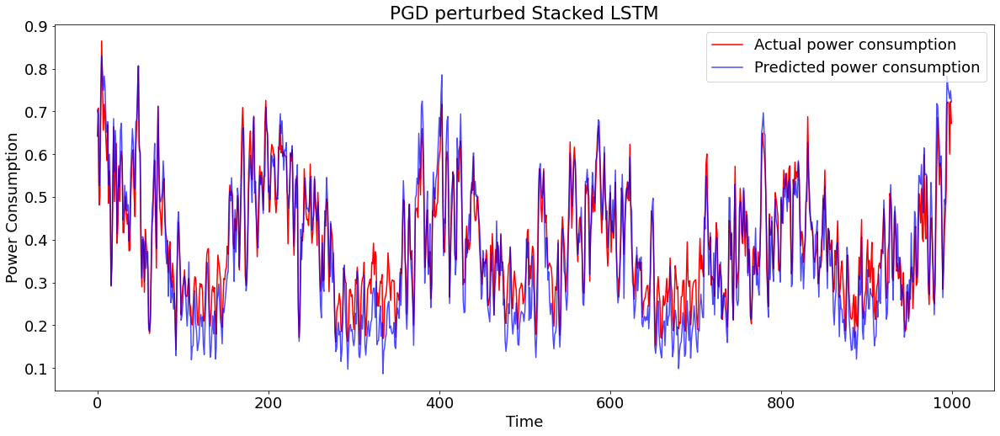

In [31]:
X_pgd_perturbed_stlstm = pgd(5, 0.1, 0.05, X_test, y_test)
pgd_predictions_stlstm = get_result(s_lstm_model, X_pgd_perturbed_stlstm, y_test, "PGD perturbed Stacked LSTM")
plot_predictions(y_test, pgd_predictions_stlstm, "PGD perturbed Stacked LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

### Attacks on GRU

Model - FGSM perturbed GRU:
R^2 Score: 0.47168919502444795
RMSE: 0.09265586530499423


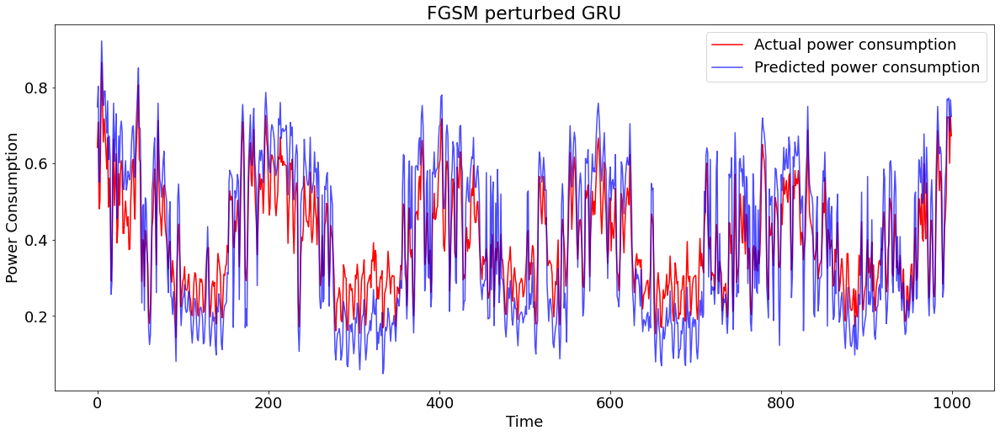

In [32]:
# need to copy the same things above
# replace the variable names carefully
X_fgsm_perturbed_gru = fgsm(X_test, y_test, epsilon=0.1) 
fgsm_predictions_gru = get_result(gru_model, X_fgsm_perturbed_gru, y_test, "FGSM perturbed GRU")
plot_predictions(y_test, fgsm_predictions_gru, "FGSM perturbed GRU", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM perturbed GRU:
R^2 Score: 0.8426712967748238
RMSE: 0.05056291879435108


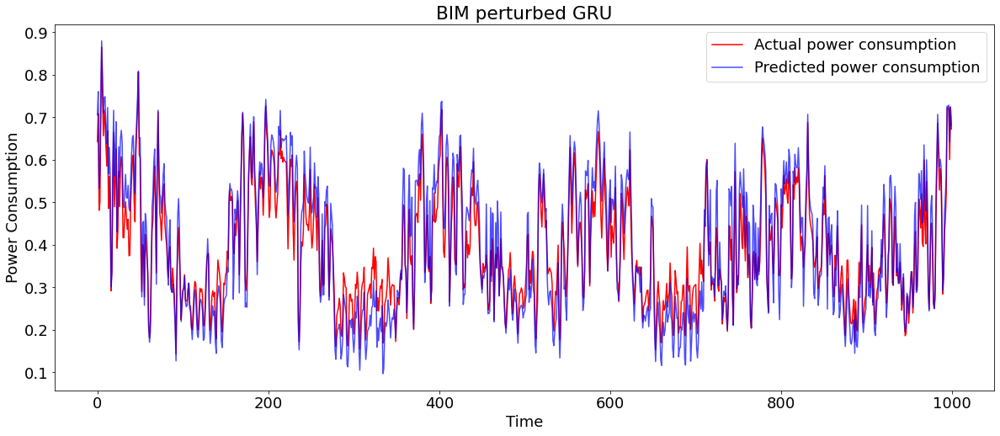

In [33]:

X_bim_perturbed_gru = bim(5, 0.1, 0.05, X_test, y_test)
bim_predictions_gru = get_result(gru_model, X_bim_perturbed_gru, y_test, "BIM perturbed GRU")
plot_predictions(y_test, bim_predictions_gru, "BIM perturbed GRU", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model - PGD perturbed GRU:
R^2 Score: 0.6546469940377211
RMSE: 0.07491345031039402


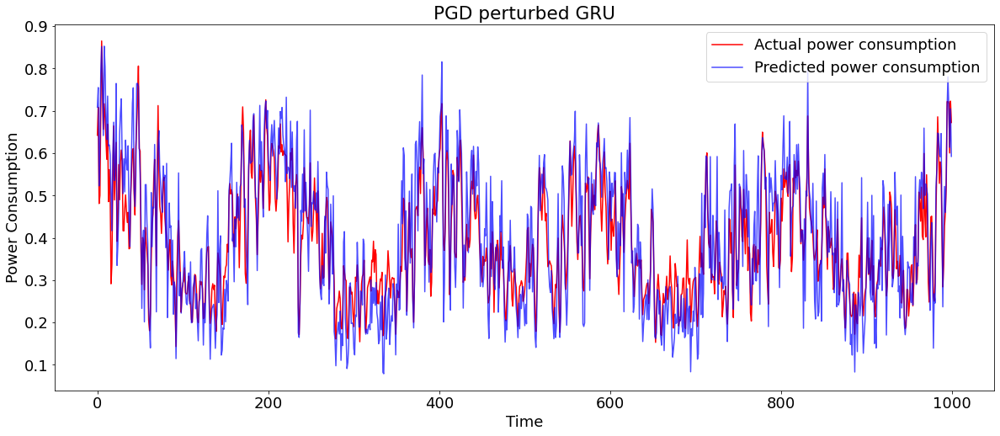

In [34]:
X_pgd_perturbed_gru = pgd(5, 0.1, 0.05, X_test, y_test)
pgd_predictions_gru = get_result(gru_model, X_pgd_perturbed_gru, y_test, "PGD perturbed GRU")
plot_predictions(y_test, pgd_predictions_gru, "PGD perturbed GRU", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

### Attacks on RNN

In [35]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed RNN:
R^2 Score: 0.3653529398496458
RMSE: 0.10155336173834321


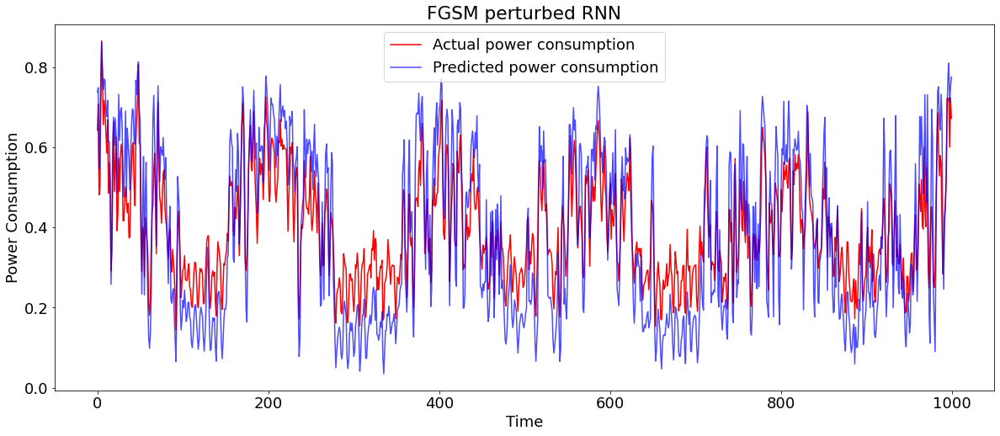

In [36]:
X_fgsm_perturbed_rnn = fgsm(X_test, y_test, epsilon=0.1) 
fgsm_predictions_rnn = get_result(rnn_model, X_fgsm_perturbed_rnn, y_test, "FGSM perturbed RNN")
plot_predictions(y_test, fgsm_predictions_rnn, "FGSM perturbed RNN", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM perturbed RNN:
R^2 Score: 0.7842638648268433
RMSE: 0.05920925707835283


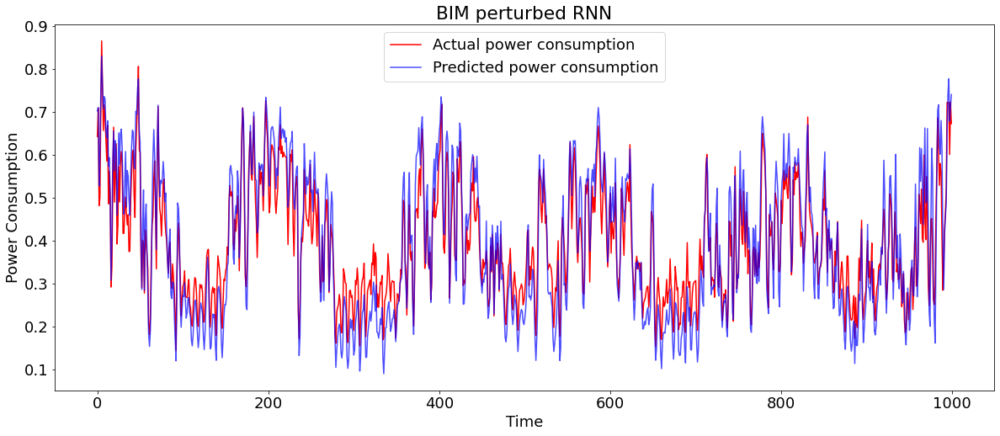

In [37]:
X_bim_perturbed_rnn = bim(5, 0.1, 0.05, X_test, y_test)
bim_predictions_rnn = get_result(rnn_model, X_bim_perturbed_rnn, y_test, "BIM perturbed RNN")
plot_predictions(y_test, bim_predictions_rnn, "BIM perturbed RNN", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model - PGD perturbed RNN:
R^2 Score: 0.5068136952688606
RMSE: 0.08952279917293579


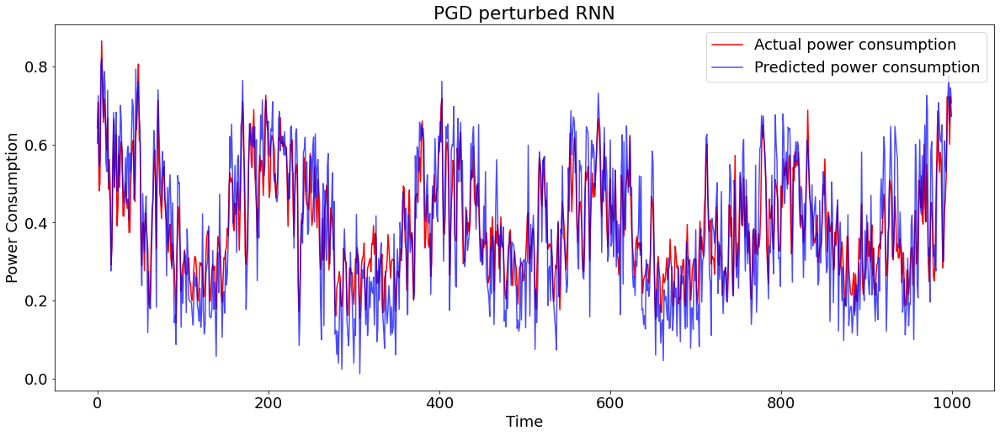

In [38]:
X_pgd_perturbed_rnn = pgd(5, 0.1, 0.05, X_test, y_test)
pgd_predictions_rnn = get_result(rnn_model, X_pgd_perturbed_rnn, y_test, "PGD perturbed RNN")
plot_predictions(y_test, pgd_predictions_rnn, "PGD perturbed RNN", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

### Attacks on CNN

In [39]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed CNN:
R^2 Score: 0.38596401606492825
RMSE: 0.09989069966821074


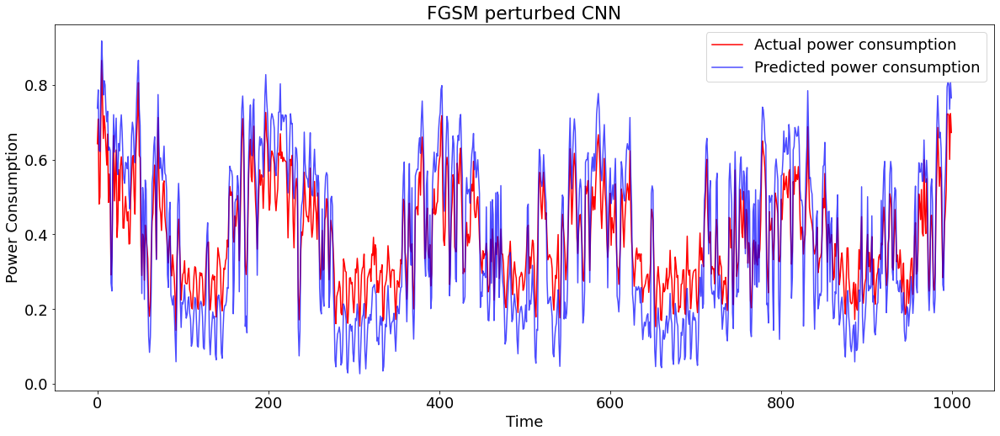

In [40]:
X_fgsm_perturbed_cnn = fgsm(X_test, y_test, epsilon=0.1) 
fgsm_predictions_cnn = get_result(cnn_model, X_fgsm_perturbed_cnn, y_test, "FGSM perturbed CNN")
plot_predictions(y_test, fgsm_predictions_cnn, "FGSM perturbed CNN", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM perturbed CNN:
R^2 Score: 0.8245569404100008
RMSE: 0.05339446902091804


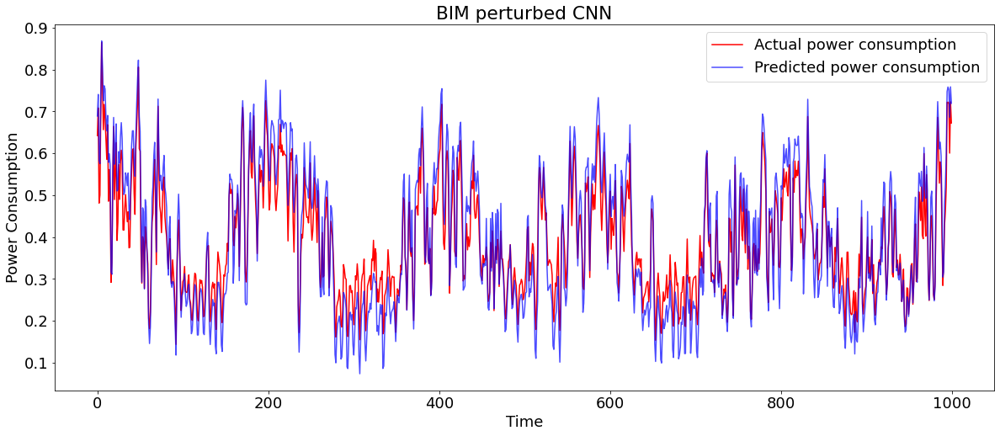

In [41]:
X_bim_perturbed_cnn = bim(5, 0.1, 0.05, X_test, y_test)
bim_predictions_cnn = get_result(cnn_model, X_bim_perturbed_cnn, y_test, "BIM perturbed CNN")
plot_predictions(y_test, bim_predictions_cnn, "BIM perturbed CNN", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model - PGD perturbed CNN:
R^2 Score: 0.6580904114710114
RMSE: 0.07453904244634849


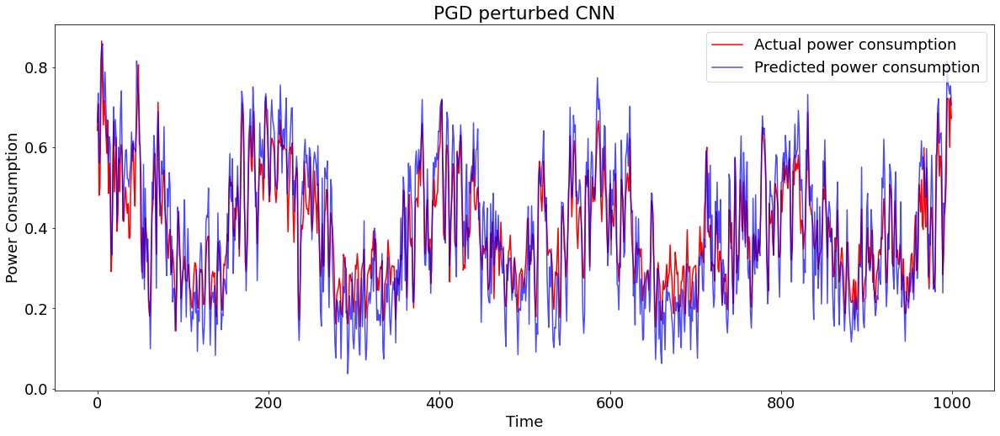

In [42]:
X_pgd_perturbed_cnn = pgd(5, 0.1, 0.05, X_test, y_test)
pgd_predictions_cnn = get_result(cnn_model, X_pgd_perturbed_cnn, y_test, "PGD perturbed CNN")
plot_predictions(y_test, pgd_predictions_cnn, "PGD perturbed CNN", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

### Attacks on CNN-LSTM

In [43]:
# need to copy the same things above
# replace the variable names carefully

Model - CNN-LSTM:
R^2 Score: 0.3861772572621296
RMSE: 0.09987335660839235


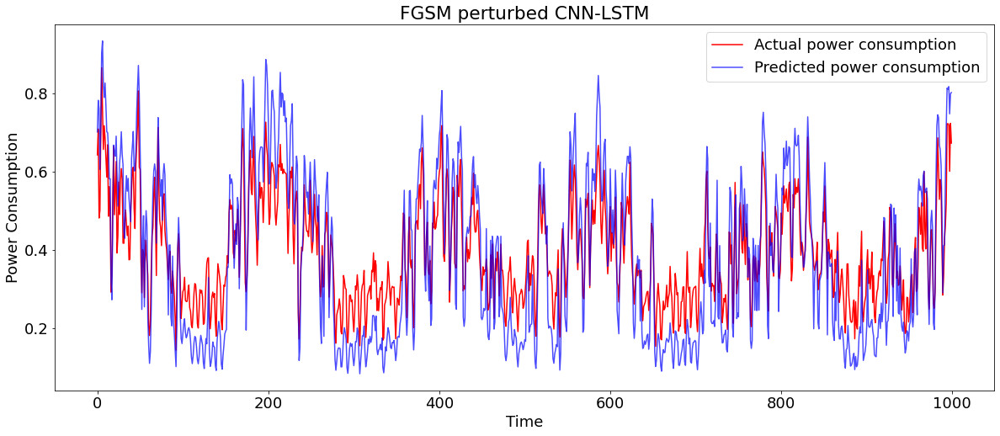

In [44]:
X_fgsm_perturbed_cnnlstm = fgsm(X_test, y_test, epsilon=0.1) 
fgsm_predictions_cnnlstm = get_result(cnn_lstm_model, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_fgsm_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, fgsm_predictions_cnnlstm, "FGSM perturbed CNN-LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM CNN-LSTM:
R^2 Score: 0.763159620365316
RMSE: 0.06203774972164881


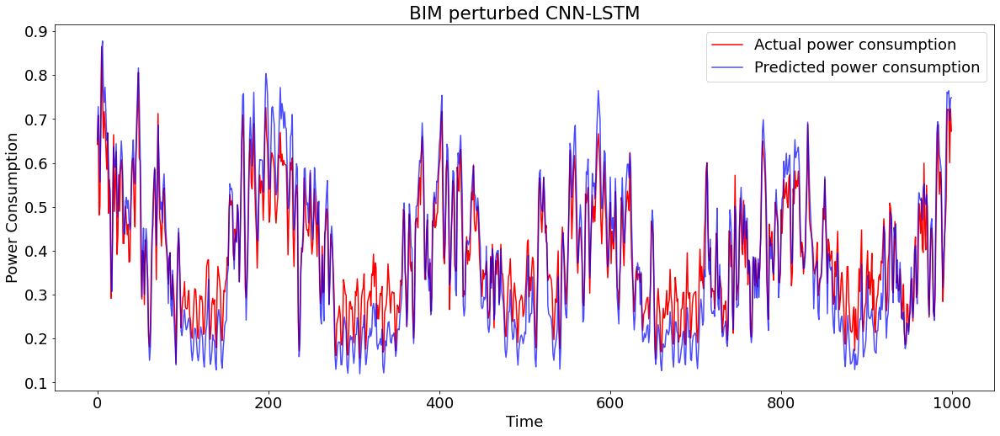

In [45]:
X_bim_perturbed_cnnlstm = bim(5, 0.1, 0.05, X_test, y_test) 
bim_predictions_cnnlstm = get_result(cnn_lstm_model, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "BIM CNN-LSTM")
plot_predictions(y_test, bim_predictions_cnnlstm, "BIM perturbed CNN-LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - PGD CNN-LSTM:
R^2 Score: 0.675506937464363
RMSE: 0.07261575793377129


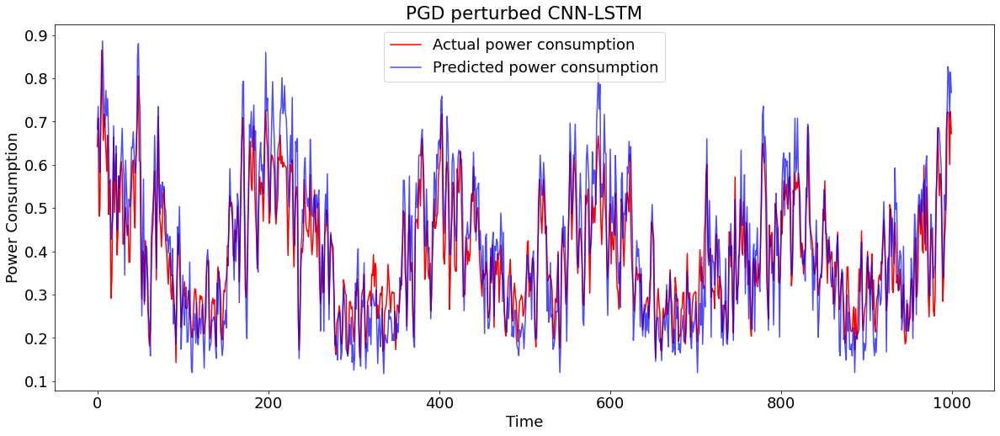

In [46]:
X_pgd_perturbed_cnnlstm = pgd(5, 0.1, 0.05, X_test, y_test) 
pgd_predictions_cnnlstm = get_result(cnn_lstm_model, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "PGD CNN-LSTM")
plot_predictions(y_test, pgd_predictions_cnnlstm, "PGD perturbed CNN-LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

### Attacks on ConvLSTM

In [47]:
# need to copy the same things above
# replace the variable names carefully

Model - Conv-LSTM:
R^2 Score: 0.3145287271010071
RMSE: 0.10554138967009825


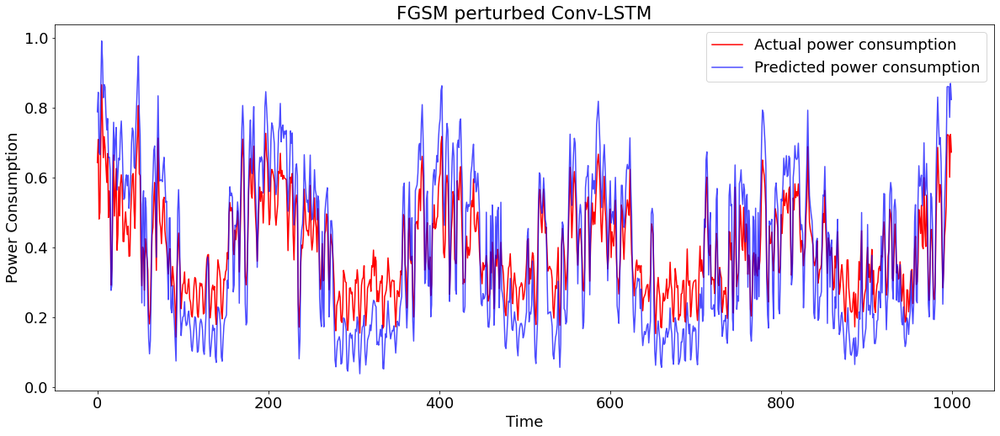

In [48]:
X_fgsm_perturbed_convlstm = fgsm(X_test, y_test, epsilon=0.1) 
fgsm_predictions_convlstm = get_result(conv_lstm_model, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_fgsm_perturbed_convlstm.shape[1], 1)), y_test, "Conv-LSTM")
plot_predictions(y_test, fgsm_predictions_convlstm, "FGSM perturbed Conv-LSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM ConvLSTM:
R^2 Score: 0.7666191485613394
RMSE: 0.06158299061529717


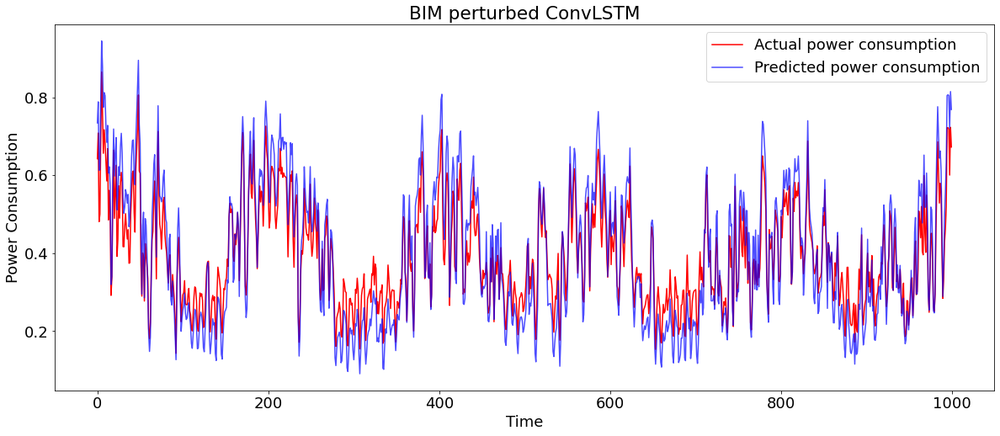

In [49]:
X_bim_perturbed_convlstm = bim(5, 0.1, 0.05, X_test, y_test) 
bim_predictions_convlstm = get_result(conv_lstm_model, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "BIM ConvLSTM")
plot_predictions(y_test, bim_predictions_convlstm, "BIM perturbed ConvLSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - PGD ConvLSTM:
R^2 Score: 0.6961651918710884
RMSE: 0.07026627133500349


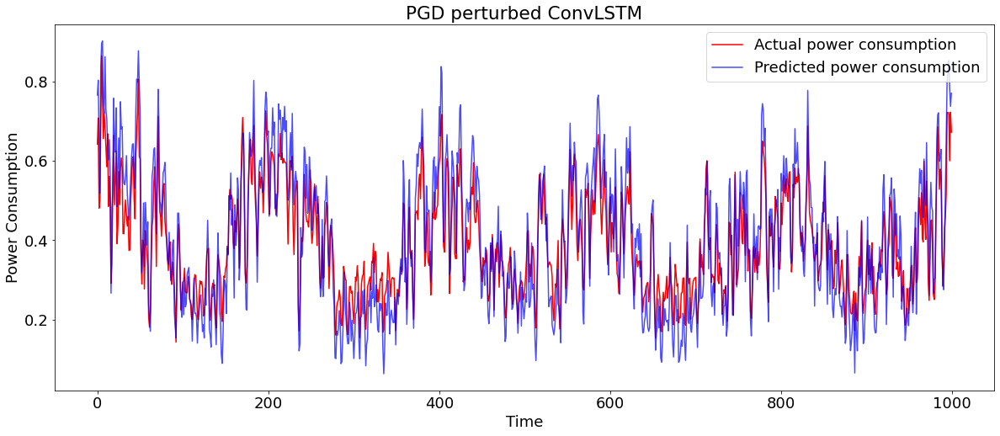

In [50]:
X_pgd_perturbed_convlstm = pgd(5, 0.1, 0.05, X_test, y_test) 
pgd_predictions_convlstm = get_result(conv_lstm_model, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "PGD ConvLSTM")
plot_predictions(y_test, pgd_predictions_convlstm, "PGD perturbed ConvLSTM", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

## Adversarial Learning

In [51]:
new_Y=np.concatenate((y_train,y_train))

In [52]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_lstm=lstm(X_new_fgsm,new_Y)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 23)                2300      
                                                                 
 dropout_5 (Dropout)         (None, 23)                0         
                                                                 
 dense_8 (Dense)             (None, 1)                 24        
                                                                 
Total params: 2,324
Trainable params: 2,324
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 3s 6ms/step - loss: 0.0169
Epoch 2/10
254/254 [==============================] - 1s 6ms/step - loss: 0.0075
Epoch 3/10
254/254 [==============================] - 1s 5ms/step - loss: 0.0051
Epoch 4/10
254/254 [==============================] - 1s 5ms/step - loss:

Model - FGSM-LSTM:
R^2 Score: 0.9115938726973797
RMSE: 0.03790263085304227


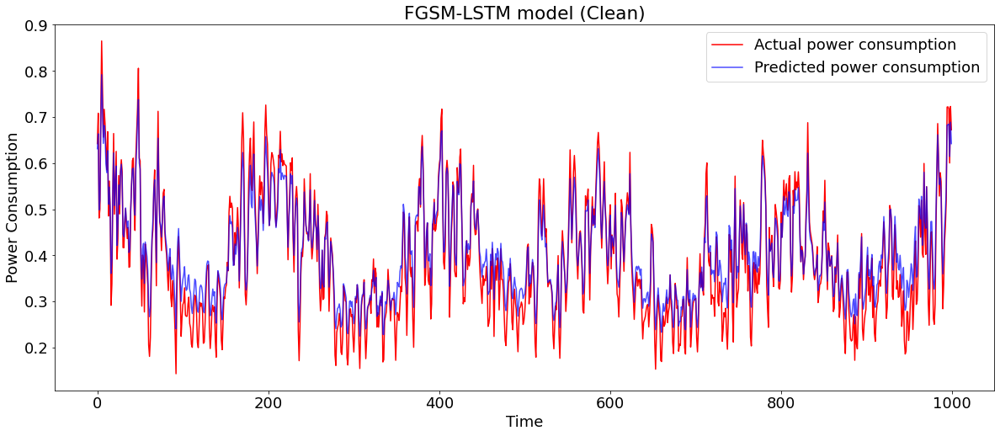

In [53]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_test, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, "FGSM-LSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - FGSM-LSTM:
R^2 Score: 0.8201348732005282
RMSE: 0.05406318811574061


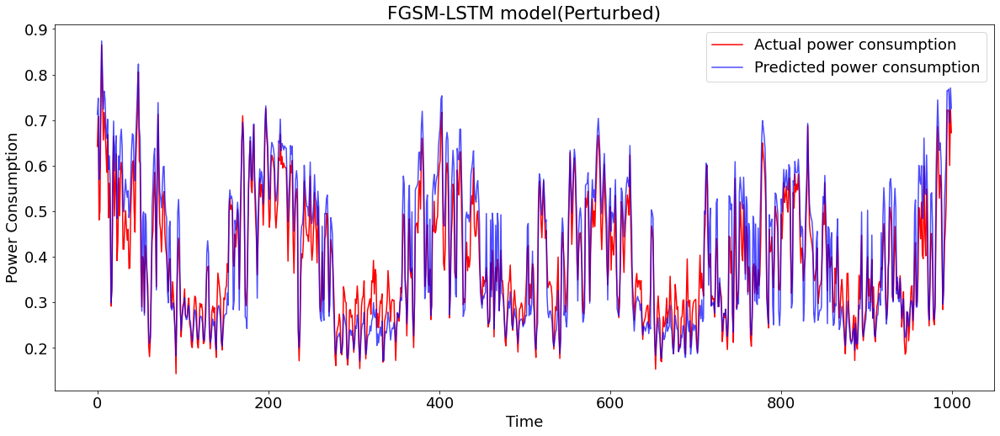

In [54]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_fgsm_perturbed_lstm, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, "FGSM-LSTM model(Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [55]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_lstm=lstm(X_new_bim,new_Y)


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_5 (LSTM)               (None, 23)                2300      
                                                                 
 dropout_6 (Dropout)         (None, 23)                0         
                                                                 
 dense_9 (Dense)             (None, 1)                 24        
                                                                 
Total params: 2,324
Trainable params: 2,324
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 3s 5ms/step - loss: 0.0177
Epoch 2/10
254/254 [==============================] - 1s 5ms/step - loss: 0.0063
Epoch 3/10
254/254 [==============================] - 1s 5ms/step - loss: 0.0046
Epoch 4/10
254/254 [==============================] - 1s 5ms/step - loss:

Model - BIM-LSTM:
R^2 Score: 0.9528150282797494
RMSE: 0.027690449958327017


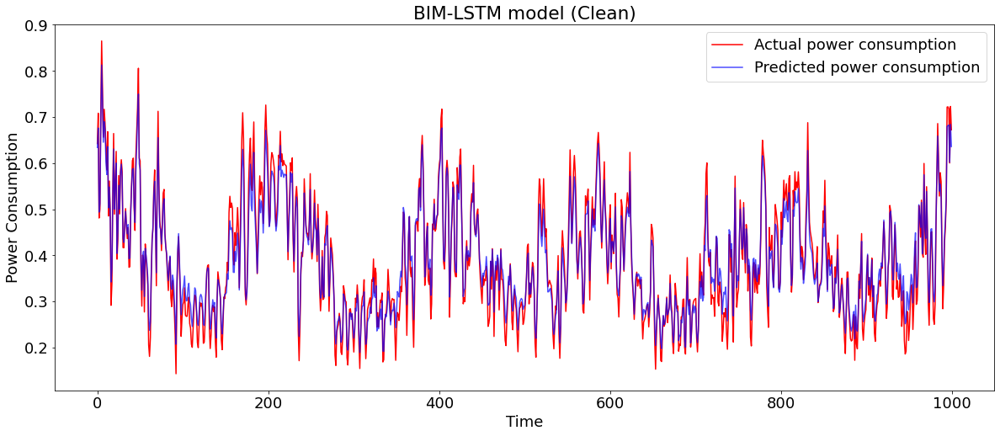

In [56]:

lstm_bim_predictions=get_result(bim_lstm, X_test, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, "BIM-LSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM-LSTM:
R^2 Score: 0.9317656867293662
RMSE: 0.033298876783442934


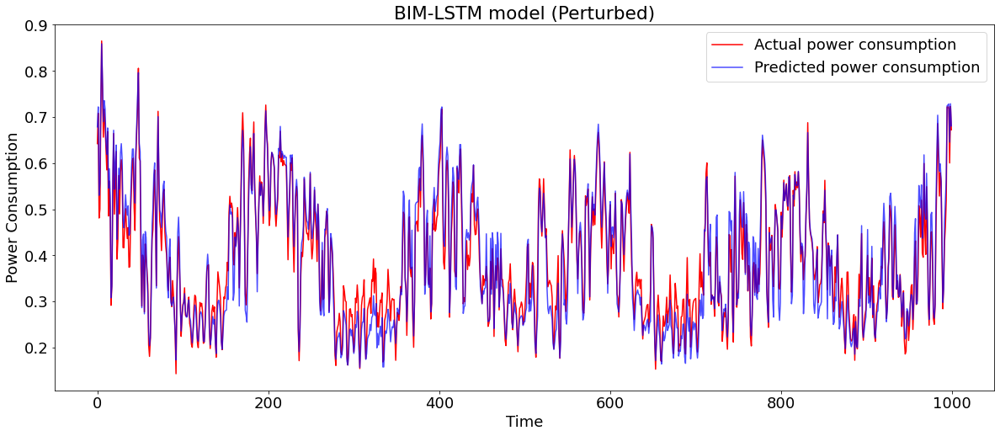

In [57]:

lstm_bim_predictions=get_result(bim_lstm, X_bim_perturbed_lstm, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, "BIM-LSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


In [58]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_lstm=lstm(X_new_pgd,new_Y)

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 23)                2300      
                                                                 
 dropout_7 (Dropout)         (None, 23)                0         
                                                                 
 dense_10 (Dense)            (None, 1)                 24        
                                                                 
Total params: 2,324
Trainable params: 2,324
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 3s 6ms/step - loss: 0.0199
Epoch 2/10
254/254 [==============================] - 1s 6ms/step - loss: 0.0072
Epoch 3/10
254/254 [==============================] - 1s 5ms/step - loss: 0.0051
Epoch 4/10
254/254 [==============================] - 2s 6ms/step - loss:

Model - PGD-LSTM:
R^2 Score: 0.93948570013511
RMSE: 0.03135863621361329


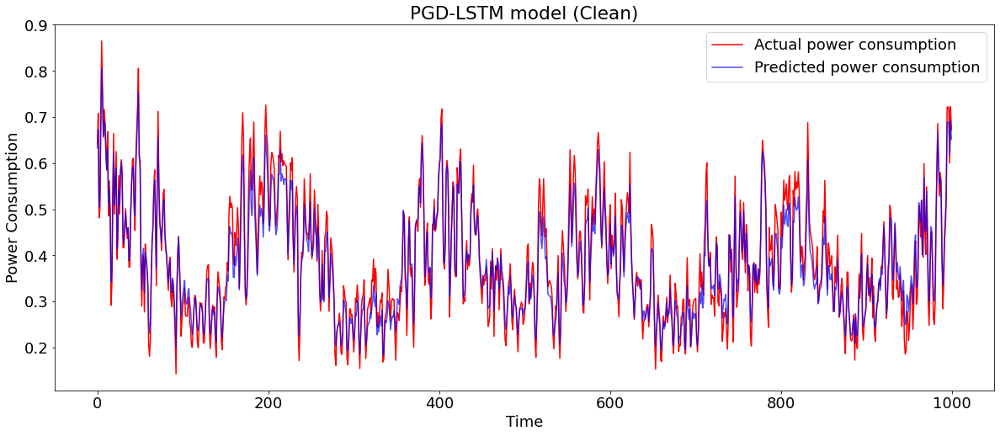

In [59]:
lstm_pgd_predictions=get_result(pgd_lstm, X_test, y_test, "PGD-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, "PGD-LSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - PGS-LSTM:
R^2 Score: 0.8635454089668728
RMSE: 0.04708930044125787


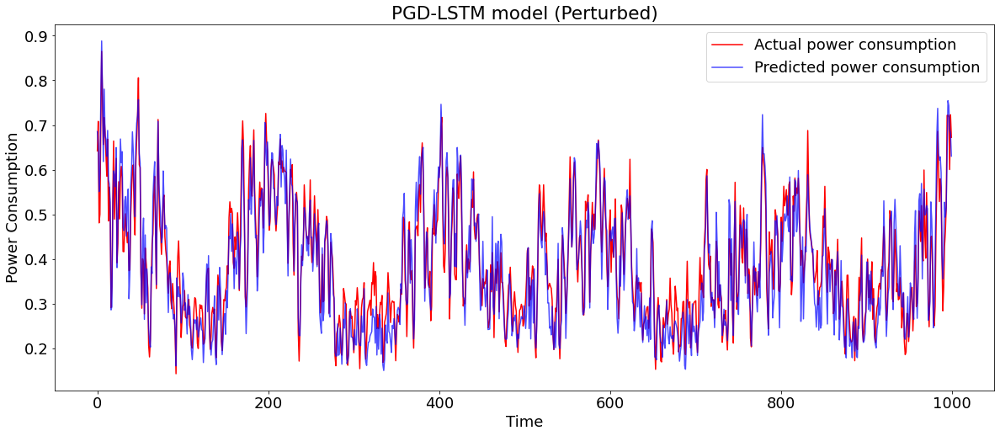

In [60]:
lstm_pgd_predictions=get_result(pgd_lstm, X_pgd_perturbed_lstm, y_test, "PGS-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, "PGD-LSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

#### Stacked LSTM

In [61]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_stlstm=stacked_lstm(X_new_fgsm,new_Y)

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 23, 23)            2300      
                                                                 
 dropout_8 (Dropout)         (None, 23, 23)            0         
                                                                 
 lstm_8 (LSTM)               (None, 15)                2340      
                                                                 
 dropout_9 (Dropout)         (None, 15)                0         
                                                                 
 dense_11 (Dense)            (None, 1)                 16        
                                                                 
Total params: 4,656
Trainable params: 4,656
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================]

Model - FGSM-StackedLSTM:
R^2 Score: 0.8962264855433478
RMSE: 0.04106496216393846


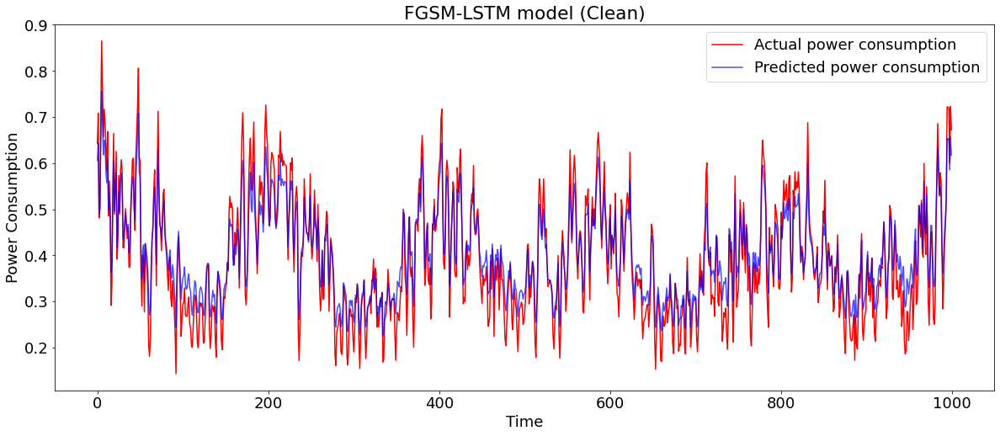

In [62]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_test, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, "FGSM-LSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - FGSM-StackedLSTM:
R^2 Score: 0.8651232006291104
RMSE: 0.046816267531360124


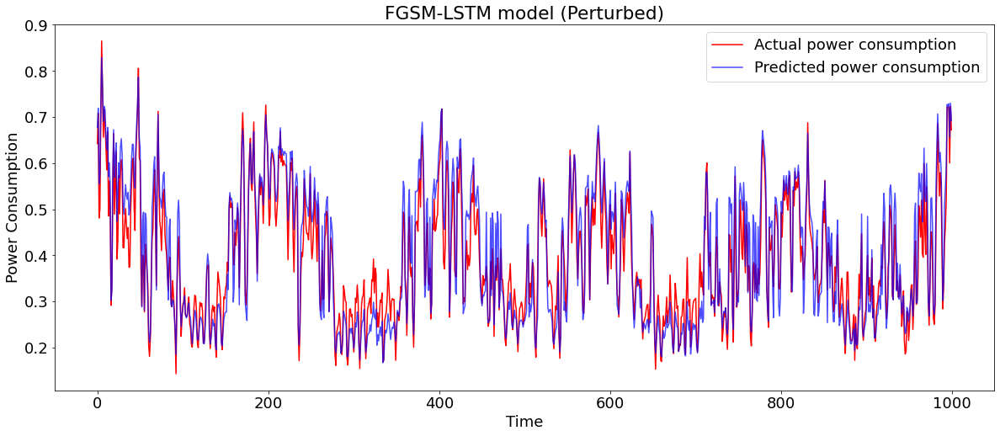

In [63]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_fgsm_perturbed_stlstm, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, "FGSM-LSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [64]:

# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_stlstm=stacked_lstm(X_new_bim,new_Y)


Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_9 (LSTM)               (None, 23, 23)            2300      
                                                                 
 dropout_10 (Dropout)        (None, 23, 23)            0         
                                                                 
 lstm_10 (LSTM)              (None, 15)                2340      
                                                                 
 dropout_11 (Dropout)        (None, 15)                0         
                                                                 
 dense_12 (Dense)            (None, 1)                 16        
                                                                 
Total params: 4,656
Trainable params: 4,656
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================]

Model - BIM-StackedLSTM:
R^2 Score: 0.923859661303722
RMSE: 0.03517511808531715


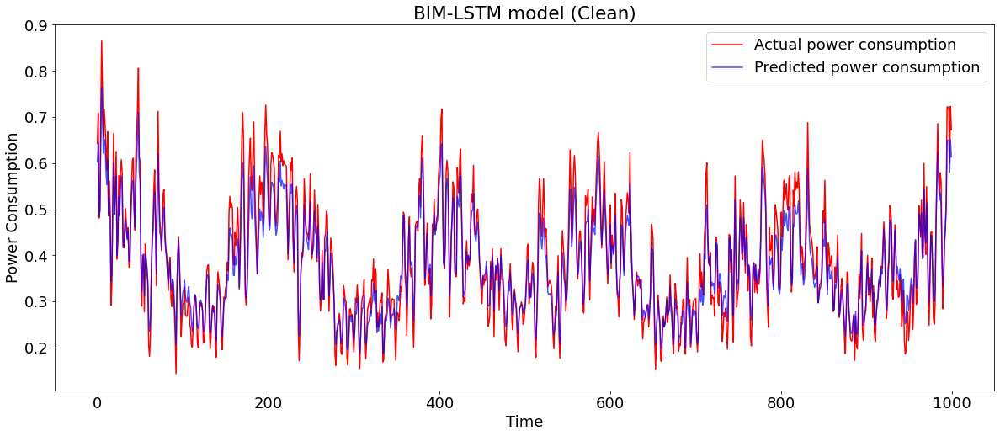

In [65]:

stlstm_bim_predictions=get_result(bim_stlstm, X_test, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, "BIM-LSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


Model - BIM-StackedLSTM:
R^2 Score: 0.9292423745059578
RMSE: 0.033908984539844915


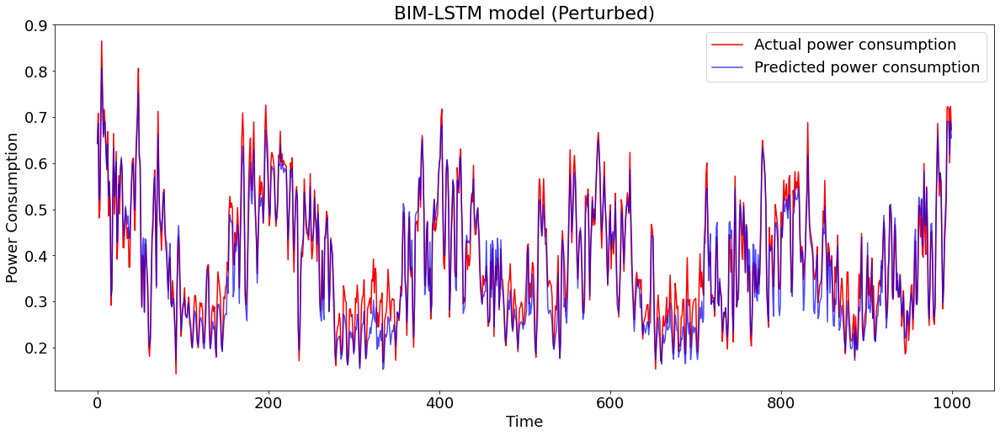

In [66]:

stlstm_bim_predictions=get_result(bim_stlstm, X_bim_perturbed_stlstm, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, "BIM-LSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


In [67]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_stlstm=stacked_lstm(X_new_pgd,new_Y)

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 23, 23)            2300      
                                                                 
 dropout_12 (Dropout)        (None, 23, 23)            0         
                                                                 
 lstm_12 (LSTM)              (None, 15)                2340      
                                                                 
 dropout_13 (Dropout)        (None, 15)                0         
                                                                 
 dense_13 (Dense)            (None, 1)                 16        
                                                                 
Total params: 4,656
Trainable params: 4,656
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================]

Model - PGD-StackedLSTM:
R^2 Score: 0.9471703152279608
RMSE: 0.02929997030437115


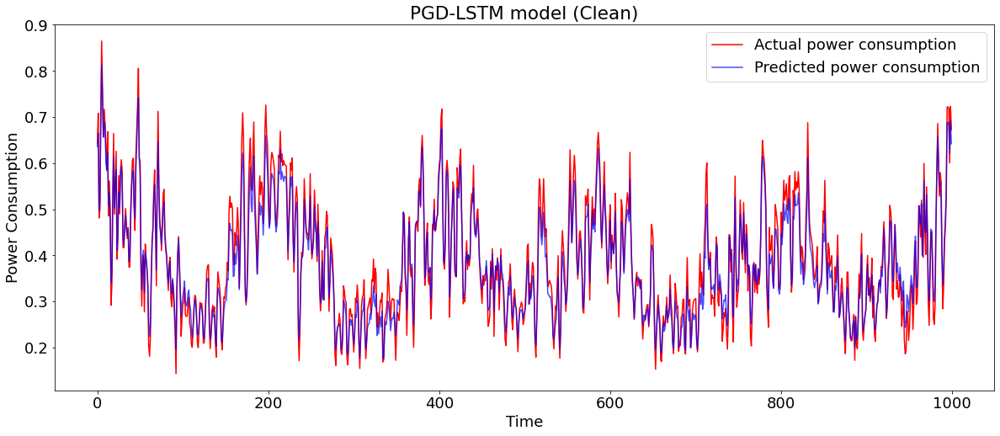

In [68]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_test, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, "PGD-LSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - PGD-StackedLSTM:
R^2 Score: 0.8505632751239338
RMSE: 0.04927842641738019


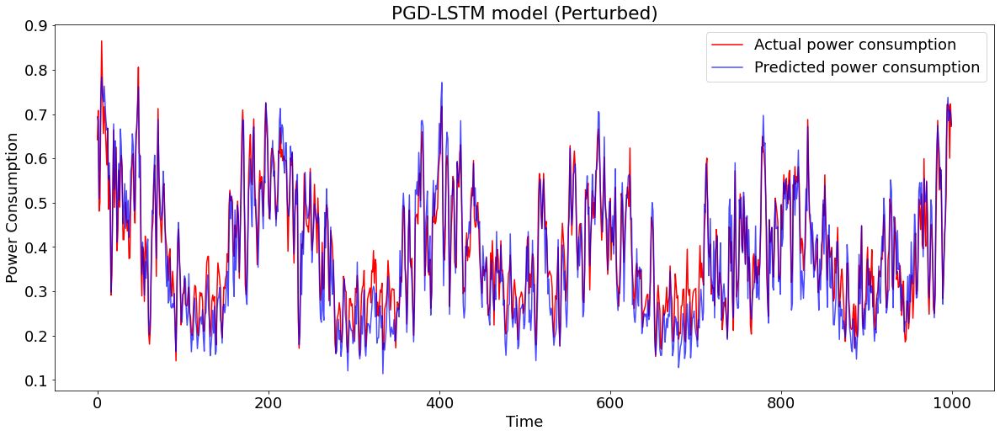

In [69]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_pgd_perturbed_stlstm, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, "PGD-LSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

#### GRU

In [70]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_gru=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_gru=gru(X_new_gru,new_Y)

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 23)                1794      
                                                                 
 dropout_14 (Dropout)        (None, 23)                0         
                                                                 
 dense_14 (Dense)            (None, 1)                 24        
                                                                 
Total params: 1,818
Trainable params: 1,818
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 3s 7ms/step - loss: 0.0216
Epoch 2/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0061
Epoch 3/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0049
Epoch 4/10
254/254 [==============================] - 2s 6ms/step - loss

Model - FGSM-GRU:
R^2 Score: 0.9127394341804522
RMSE: 0.03765625845347108


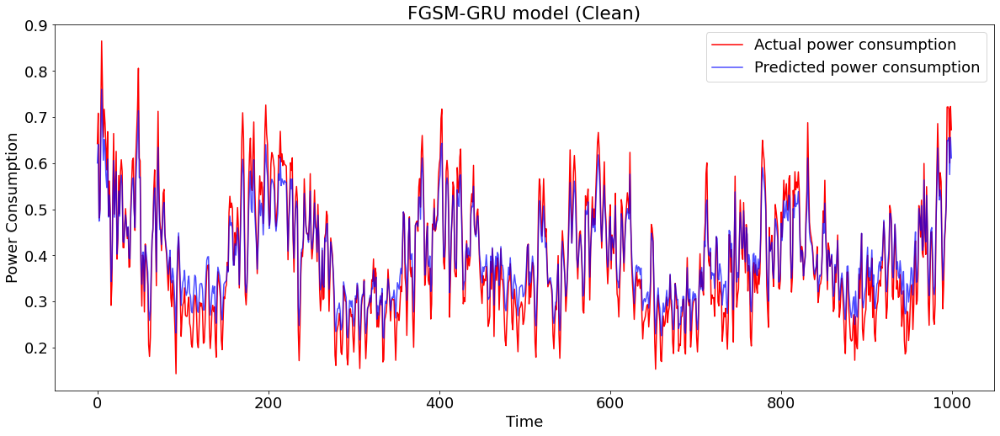

In [71]:
gru_fgsm_predictions=get_result(fgsm_gru, X_test, y_test, "FGSM-GRU")
plot_predictions(y_test, gru_fgsm_predictions, "FGSM-GRU model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - FGSM-StackedLSTM:
R^2 Score: 0.8317366313537906
RMSE: 0.052290523212274294


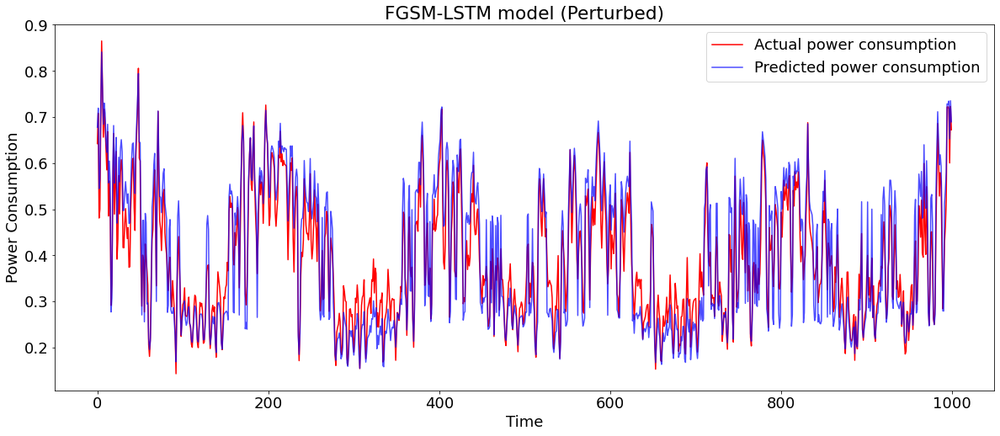

In [72]:
gru_fgsm_predictions=get_result(fgsm_gru, X_fgsm_perturbed_gru, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, gru_fgsm_predictions, "FGSM-LSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")


In [73]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_bim_perturbed_train))
bim_gru=gru(X_new_gru,new_Y)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_2 (GRU)                 (None, 23)                1794      
                                                                 
 dropout_15 (Dropout)        (None, 23)                0         
                                                                 
 dense_15 (Dense)            (None, 1)                 24        
                                                                 
Total params: 1,818
Trainable params: 1,818
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 3s 6ms/step - loss: 0.0123
Epoch 2/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0043
Epoch 3/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0032
Epoch 4/10
254/254 [==============================] - 2s 6ms/step - loss

Model - BIM-GRU:
R^2 Score: 0.93397538595642
RMSE: 0.03275526453385293


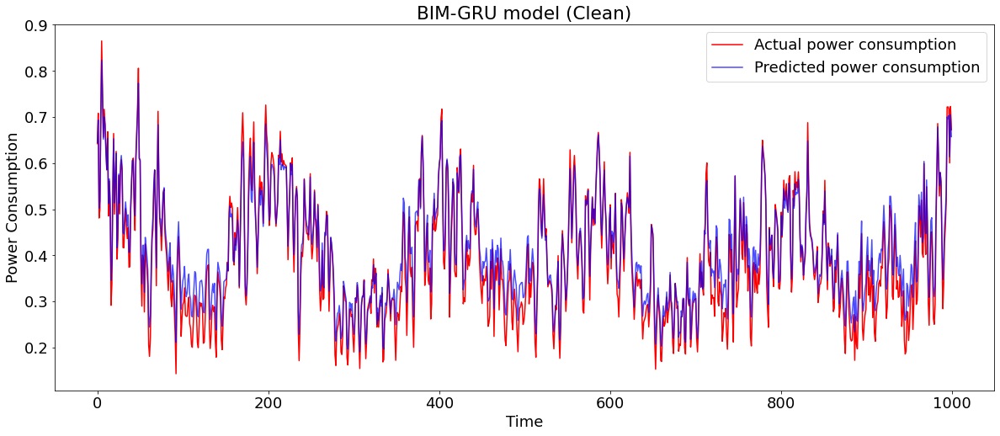

In [74]:
gru_bim_predictions=get_result(bim_gru, X_test, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, "BIM-GRU model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM-GRU:
R^2 Score: 0.9003311761486887
RMSE: 0.040244618634923714


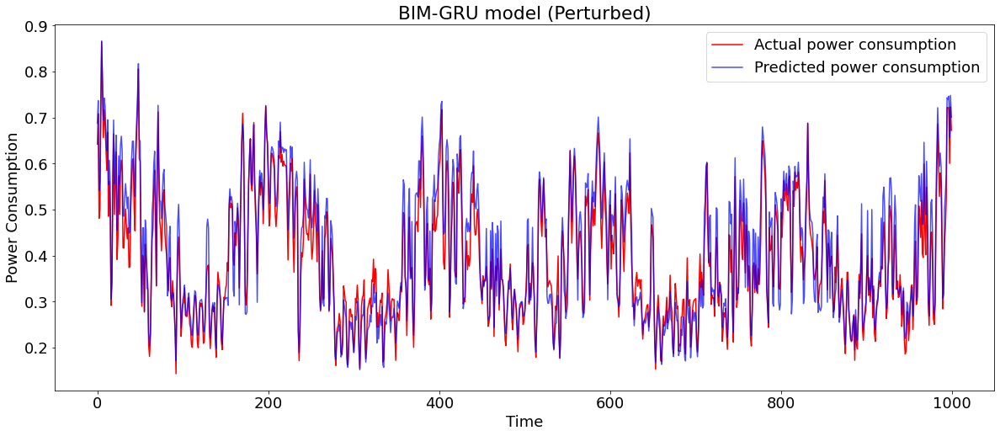

In [75]:
gru_bim_predictions=get_result(bim_gru, X_bim_perturbed_gru, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, "BIM-GRU model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [76]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_gru=gru(X_new_gru,new_Y)

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 23)                1794      
                                                                 
 dropout_16 (Dropout)        (None, 23)                0         
                                                                 
 dense_16 (Dense)            (None, 1)                 24        
                                                                 
Total params: 1,818
Trainable params: 1,818
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 3s 6ms/step - loss: 0.0567
Epoch 2/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0088
Epoch 3/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0055
Epoch 4/10
254/254 [==============================] - 2s 6ms/step - loss

Model - PGD-GRU:
R^2 Score: 0.9540293566738823
RMSE: 0.027331813693356286


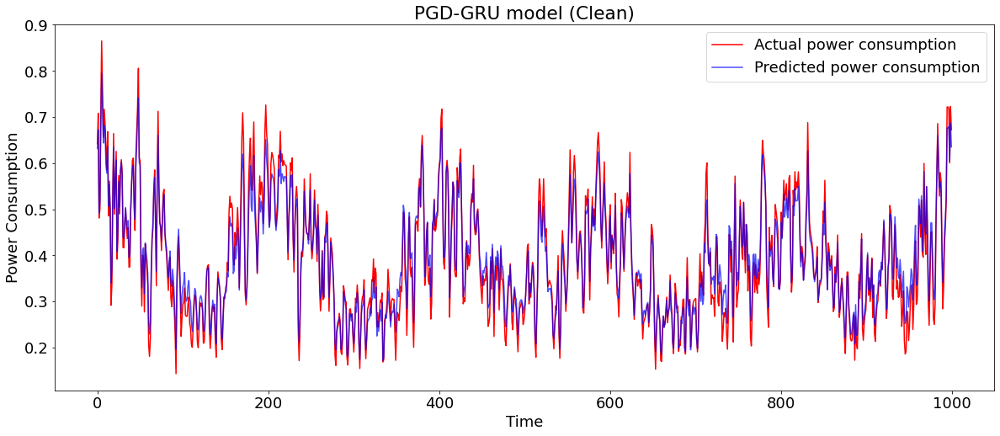

In [77]:
gru_pgd_predictions=get_result(pgd_gru, X_test, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, "PGD-GRU model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - PGD-GRU:
R^2 Score: 0.8259182033604641
RMSE: 0.05318691864925872


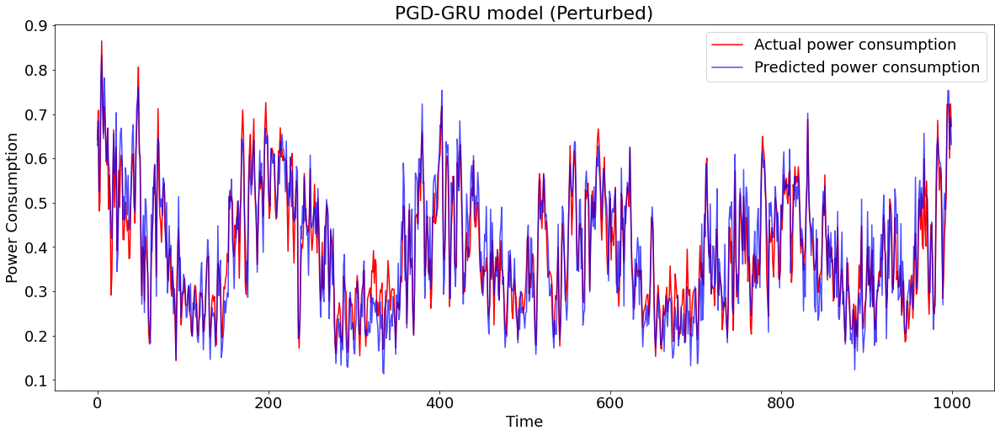

In [78]:
gru_pgd_predictions=get_result(pgd_gru, X_pgd_perturbed_gru, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, "PGD-GRU model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

#### RNN

In [79]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_rnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 23)                575       
                                                                 
 dropout_17 (Dropout)        (None, 23)                0         
                                                                 
 dense_17 (Dense)            (None, 1)                 24        
                                                                 
Total params: 599
Trainable params: 599
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 2s 4ms/step - loss: 0.0166
Epoch 2/10
254/254 [==============================] - 1s 3ms/step - loss: 0.0057
Epoch 3/10
254/254 [==============================] - 1s 5ms/step - loss: 0.0046
Epoch 4/10
254/254 [==============================] - 1s 5ms/step - loss: 0.

Model - FGSM-RNN:
R^2 Score: 0.926334363289923
RMSE: 0.03459876837099948


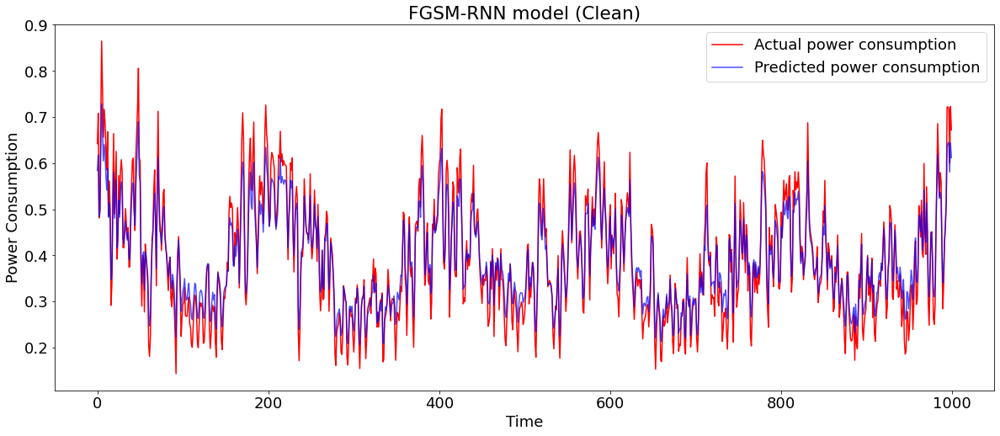

In [80]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_test, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, "FGSM-RNN model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - FGSM-RNN:
R^2 Score: 0.8392849011717648
RMSE: 0.05110419043123307


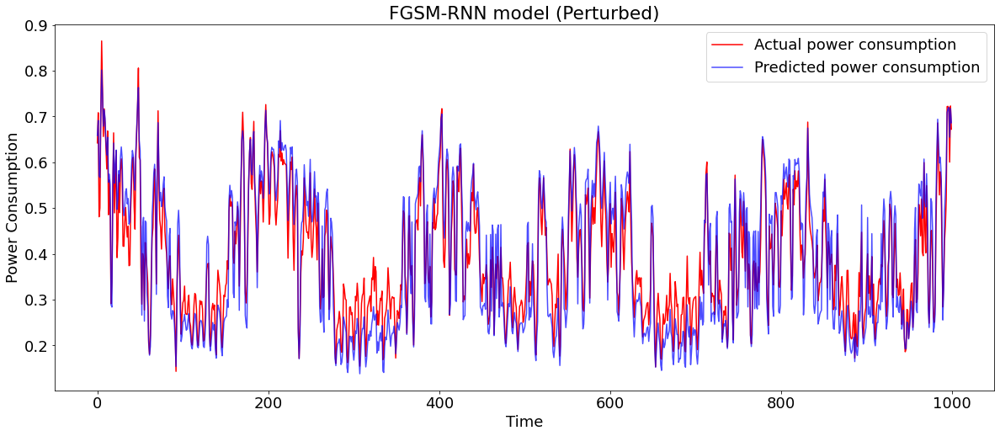

In [81]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_fgsm_perturbed_rnn, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, "FGSM-RNN model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [82]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_2 (SimpleRNN)    (None, 23)                575       
                                                                 
 dropout_18 (Dropout)        (None, 23)                0         
                                                                 
 dense_18 (Dense)            (None, 1)                 24        
                                                                 
Total params: 599
Trainable params: 599
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 2s 3ms/step - loss: 0.0069
Epoch 2/10
254/254 [==============================] - 1s 3ms/step - loss: 0.0034
Epoch 3/10
254/254 [==============================] - 1s 3ms/step - loss: 0.0029
Epoch 4/10
254/254 [==============================] - 1s 3ms/step - loss: 0.

Model - BIM-RNN:
R^2 Score: 0.9628350657029509
RMSE: 0.024575074451557863


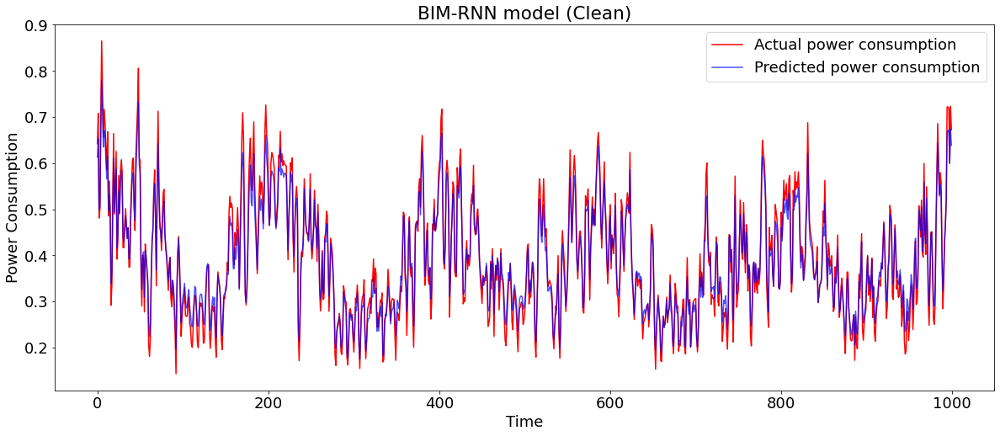

In [83]:
rnn_bim_predictions=get_result(bim_rnn, X_test, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, "BIM-RNN model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM-RNN:
R^2 Score: 0.9267011024943382
RMSE: 0.03451253574021747


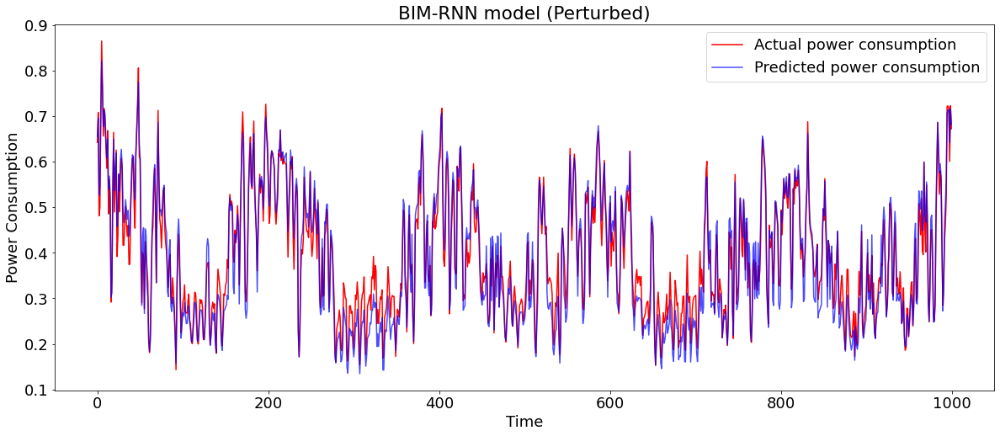

In [84]:
rnn_bim_predictions=get_result(bim_rnn, X_bim_perturbed_rnn, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, "BIM-RNN model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [85]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_3 (SimpleRNN)    (None, 23)                575       
                                                                 
 dropout_19 (Dropout)        (None, 23)                0         
                                                                 
 dense_19 (Dense)            (None, 1)                 24        
                                                                 
Total params: 599
Trainable params: 599
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 2s 3ms/step - loss: 0.0140
Epoch 2/10
254/254 [==============================] - 1s 3ms/step - loss: 0.0051
Epoch 3/10
254/254 [==============================] - 1s 3ms/step - loss: 0.0041
Epoch 4/10
254/254 [==============================] - 1s 3ms/step - loss: 0.

Model - PGD-RNN:
R^2 Score: 0.9528155832208296
RMSE: 0.02769028704631231


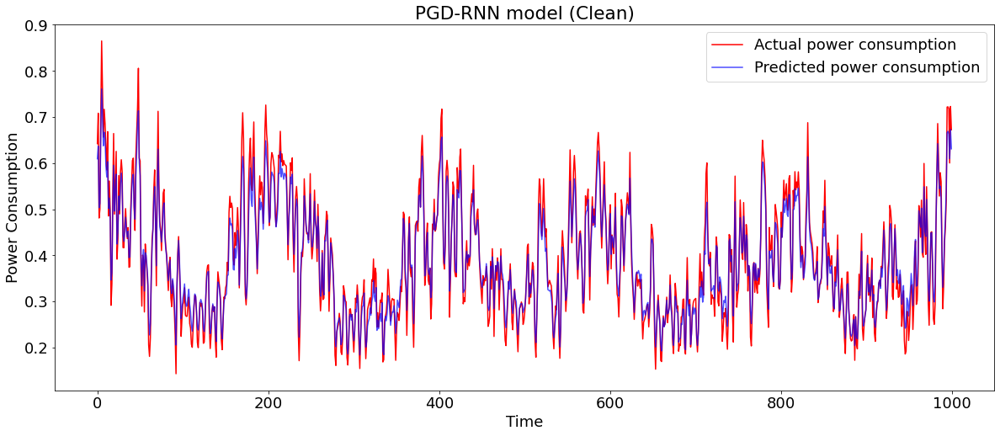

In [86]:
rnn_pgd_predictions=get_result(pgd_rnn, X_test, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, "PGD-RNN model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - PGD-RNN:
R^2 Score: 0.8713337559049262
RMSE: 0.04572571304268102


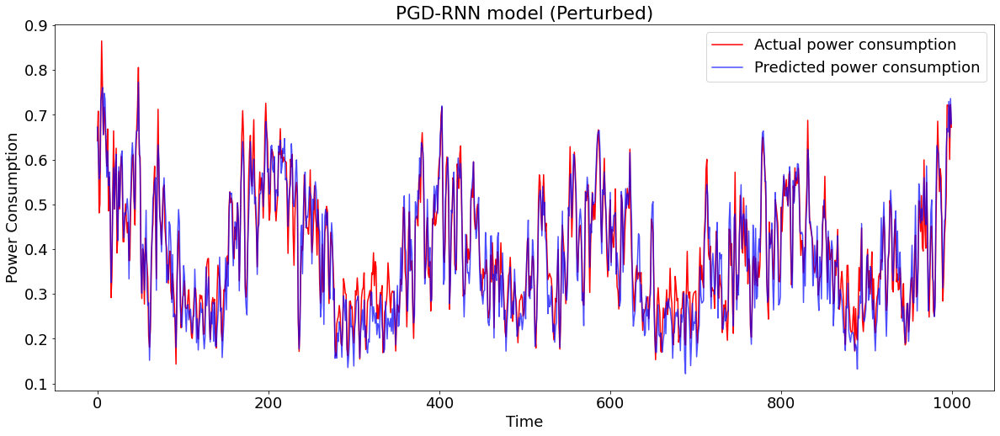

In [87]:
rnn_pgd_predictions=get_result(pgd_rnn, X_pgd_perturbed_rnn, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, "PGD-RNN model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

#### CNN

In [88]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_cnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 704)               0         
                                                                 
 dense_20 (Dense)            (None, 10)                7050      
                                                                 
 dense_21 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - FGSM-CNN:
R^2 Score: 0.9062570367303115
RMSE: 0.03902990650326459


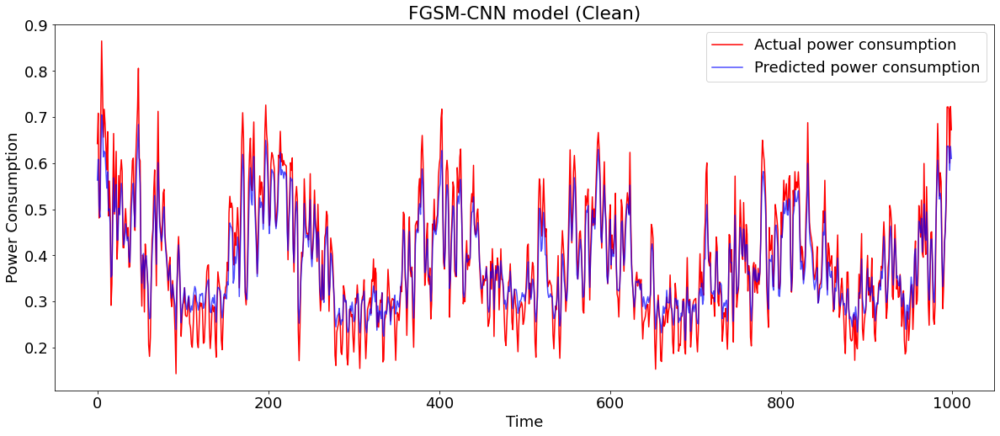

In [89]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_test, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, "FGSM-CNN model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - FGSM-CNN:
R^2 Score: 0.9220866633112712
RMSE: 0.035582305207780336


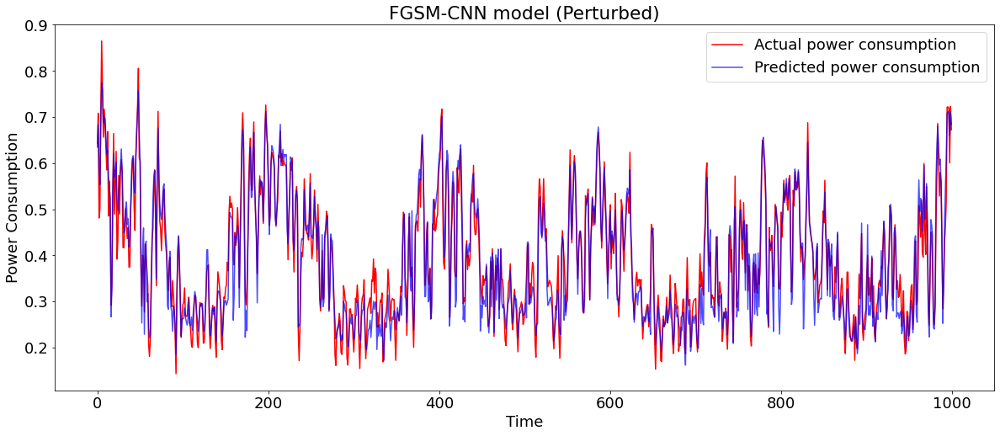

In [90]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_fgsm_perturbed_cnn, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, "FGSM-CNN model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [91]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 704)               0         
                                                                 
 dense_22 (Dense)            (None, 10)                7050      
                                                                 
 dense_23 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - BIM-CNN:
R^2 Score: 0.9555443124516758
RMSE: 0.026877683424815075


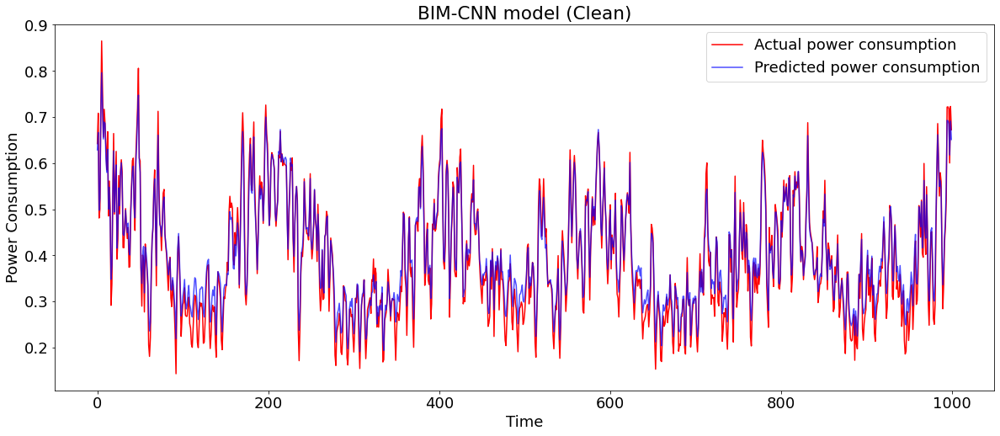

In [92]:
cnn_bim_predictions=get_result(bim_cnn, X_test, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, "BIM-CNN model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - BIM-CNN:
R^2 Score: 0.9466697988630302
RMSE: 0.029438439712589932


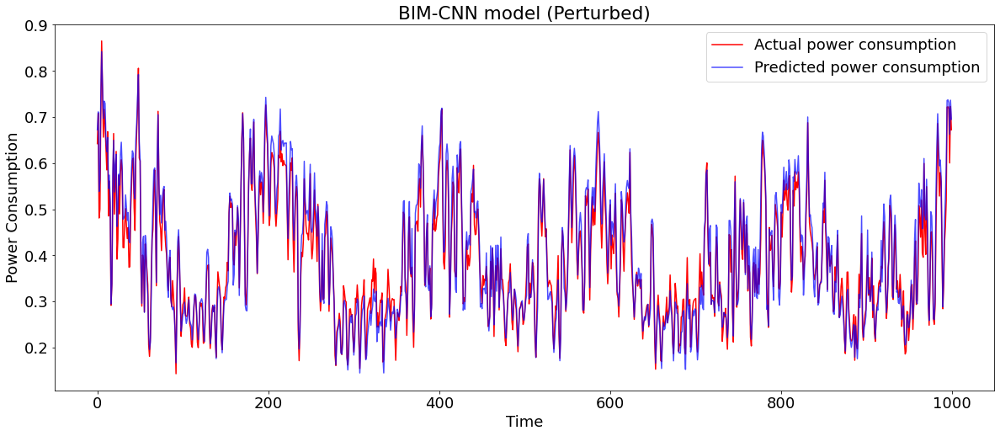

In [93]:
cnn_bim_predictions=get_result(bim_cnn, X_bim_perturbed_cnn, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, "BIM-CNN model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [94]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_5 (Flatten)         (None, 704)               0         
                                                                 
 dense_24 (Dense)            (None, 10)                7050      
                                                                 
 dense_25 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - PGD-CNN:
R^2 Score: 0.9484640417580064
RMSE: 0.028938988401444665


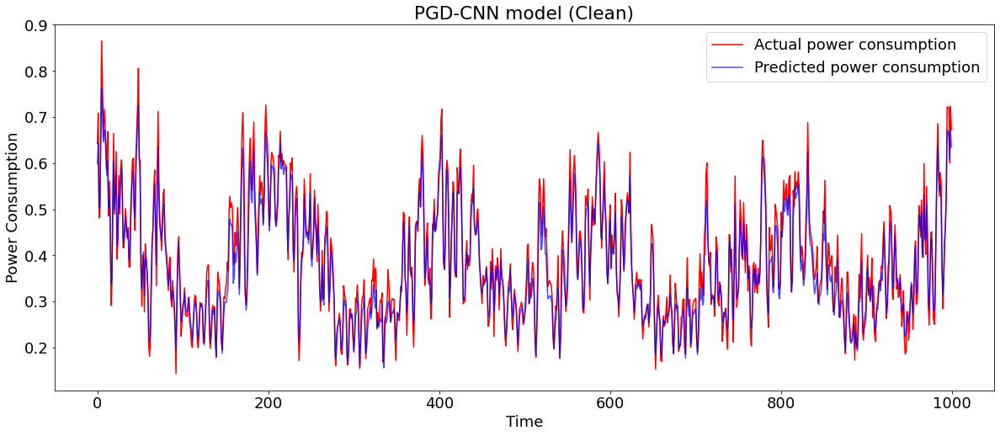

In [95]:
cnn_pgd_predictions=get_result(pgd_cnn, X_test, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, "PGD-CNN model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - PGD-CNN:
R^2 Score: 0.8807073952051332
RMSE: 0.044028604569352515


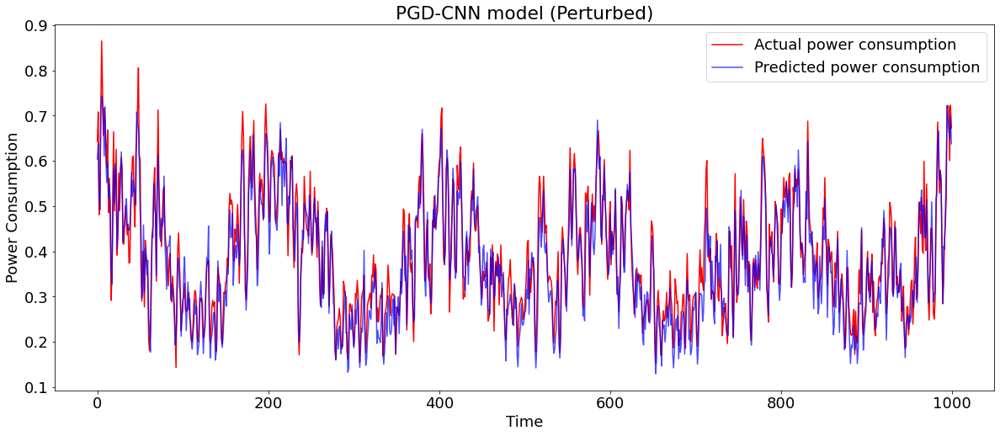

In [96]:
cnn_pgd_predictions=get_result(pgd_cnn, X_pgd_perturbed_cnn, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, "PGD-CNN model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

#### CNN_LSTM

In [97]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_cnnlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_13 (LSTM)              (None, 20)                58000     
                                                                 
 dense_26 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.90176196597065
RMSE: 0.03995471303645938


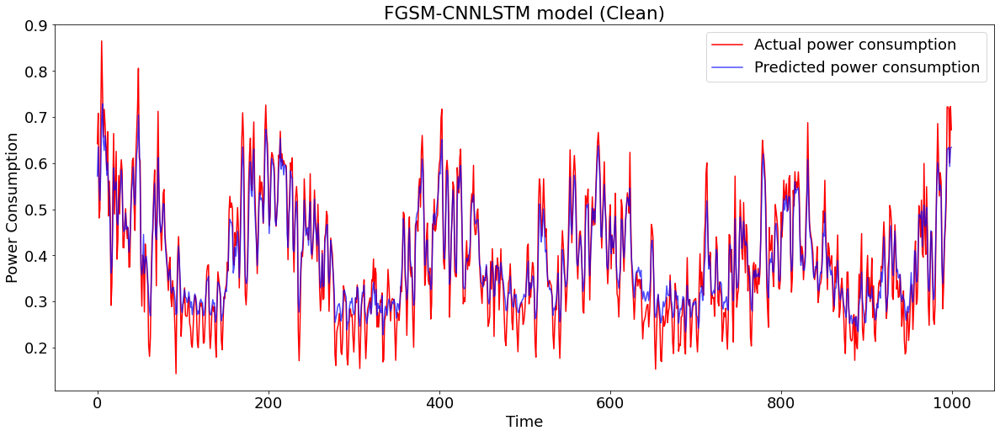

In [98]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, "FGSM-CNNLSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - CNN-LSTM:
R^2 Score: 0.8900497337356414
RMSE: 0.04226942226668014


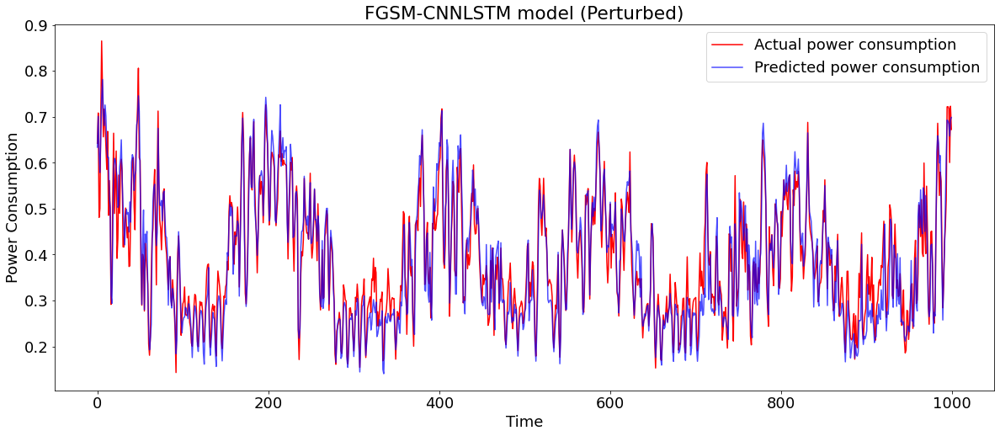

In [99]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, "FGSM-CNNLSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [100]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_6 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_8 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_14 (LSTM)              (None, 20)                58000     
                                                                 
 dense_27 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.9304330447836945
RMSE: 0.033622474227890504


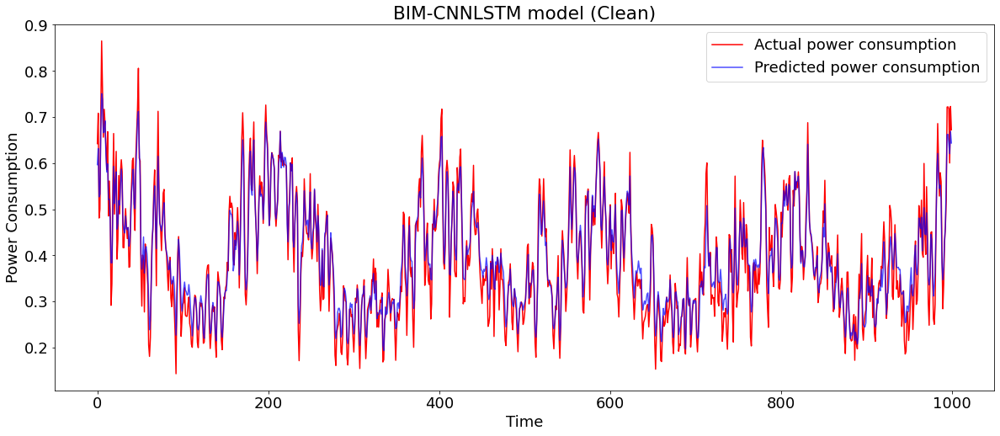

In [101]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, "BIM-CNNLSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - CNN-LSTM:
R^2 Score: 0.9020602429736759
RMSE: 0.039894009894797876


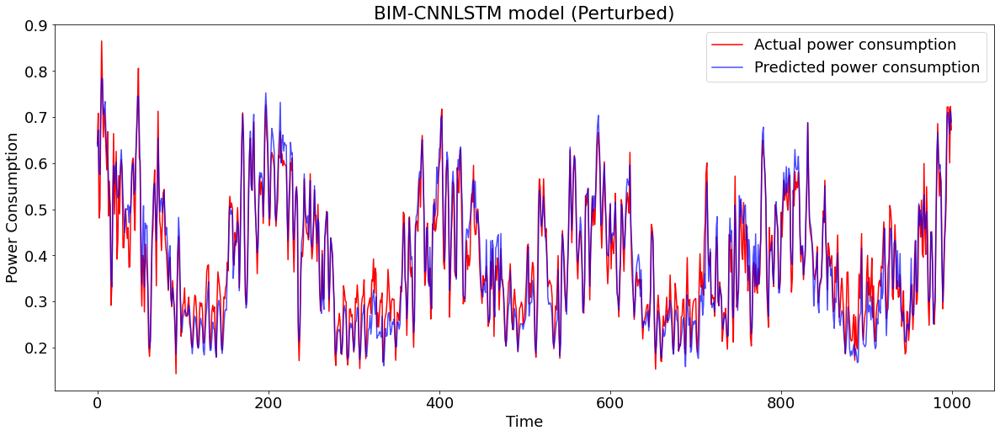

In [102]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, "BIM-CNNLSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [103]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_9 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_10 (TimeDi  (None, None, 11, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, None, 704)        0         
 stributed)                                                      
                                                                 
 lstm_15 (LSTM)              (None, 20)                58000     
                                                                 
 dense_28 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.9433598447305176
RMSE: 0.030338241066760068


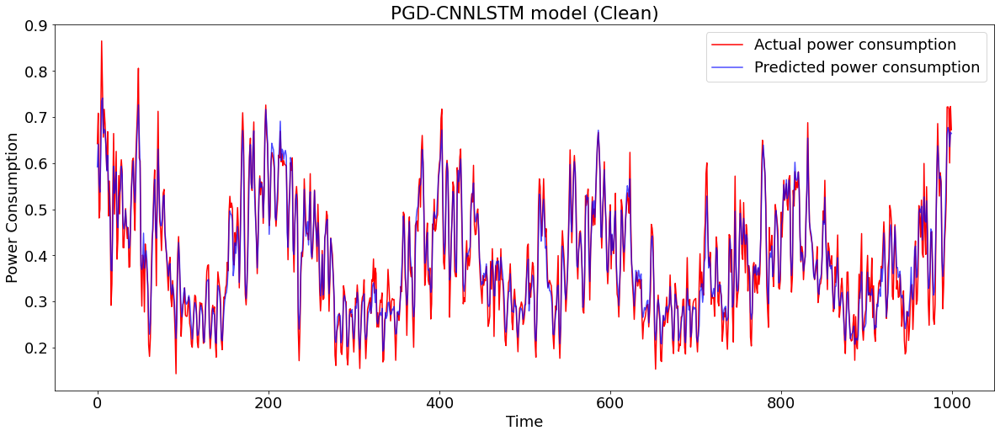

In [104]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, "PGD-CNNLSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - CNN-LSTM:
R^2 Score: 0.8849486387650433
RMSE: 0.04323884217055843


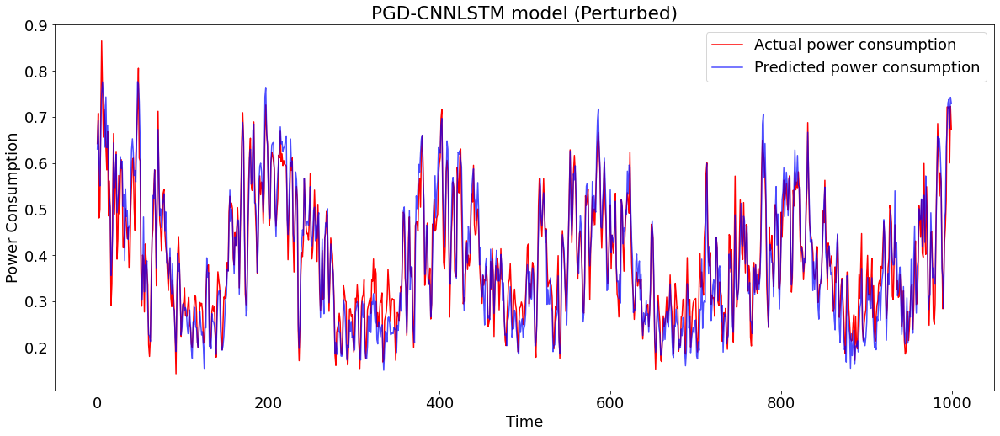

In [105]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, "PGD-CNNLSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

#### ConvLSTM

In [106]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_convlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_1 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_9 (Flatten)         (None, 1408)              0         
                                                                 
 dense_29 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 4s 6ms/step - loss: 0.0168
Epoch 2/10
254/254 [==============================] - 1s 6ms/step - loss: 0.0035
Epoch 3/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0030
Epoch 4/10
254/254 [==============================] - 2s 6ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.9065115221483124
RMSE: 0.03897689290049064


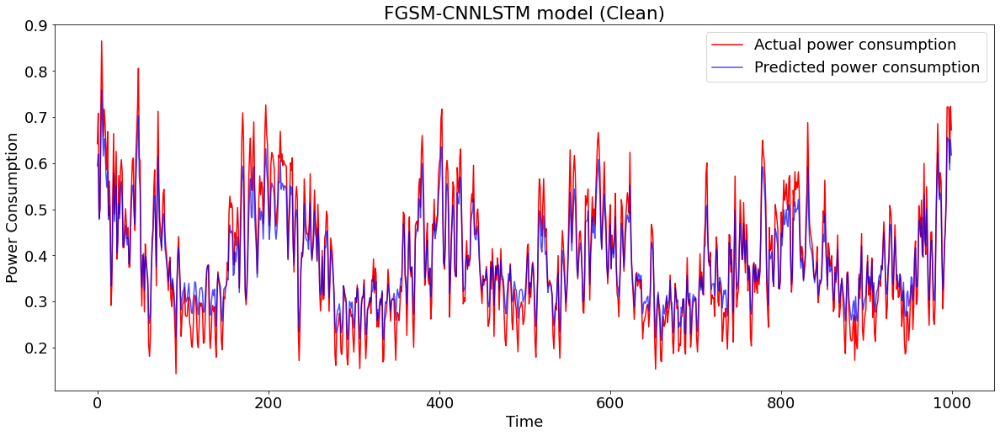

In [107]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, "FGSM-CNNLSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - ConvLSTM:
R^2 Score: 0.9082580055913656
RMSE: 0.03861110619625878


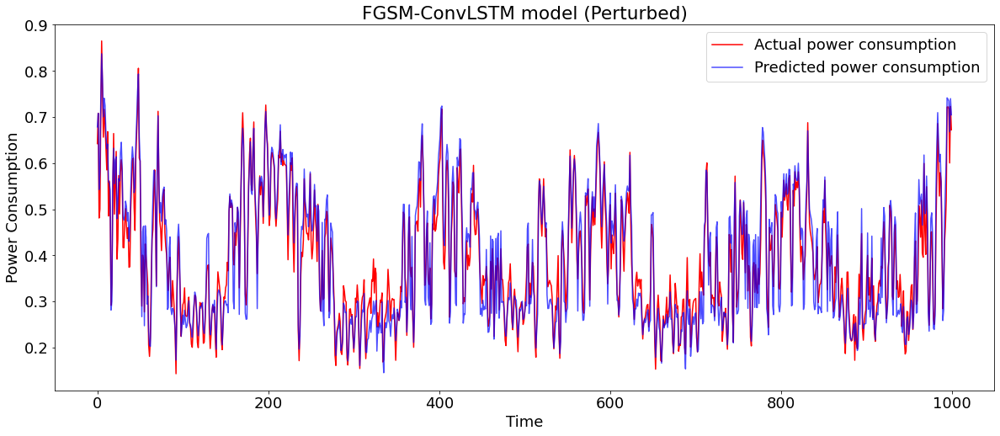

In [108]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, "FGSM-ConvLSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [109]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_2 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_10 (Flatten)        (None, 1408)              0         
                                                                 
 dense_30 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 4s 6ms/step - loss: 0.0176
Epoch 2/10
254/254 [==============================] - 2s 6ms/step - loss: 0.0024
Epoch 3/10
254/254 [==============================] - 1s 6ms/step - loss: 0.0018
Epoch 4/10
254/254 [==============================] - 1s 5ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.9433543856427704
RMSE: 0.03033970206334298


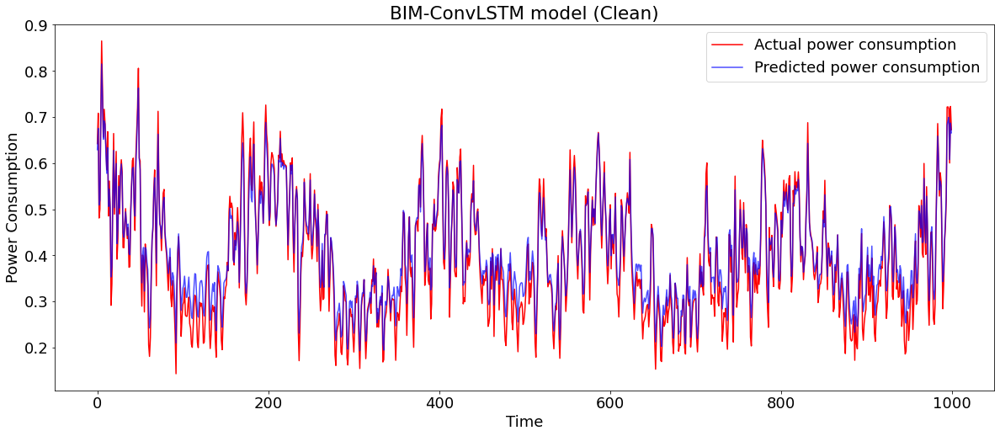

In [110]:
convlstm_bim_predictions=get_result(bim_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, "BIM-ConvLSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - ConvLSTM:
R^2 Score: 0.9255767959578435
RMSE: 0.034776216404490946


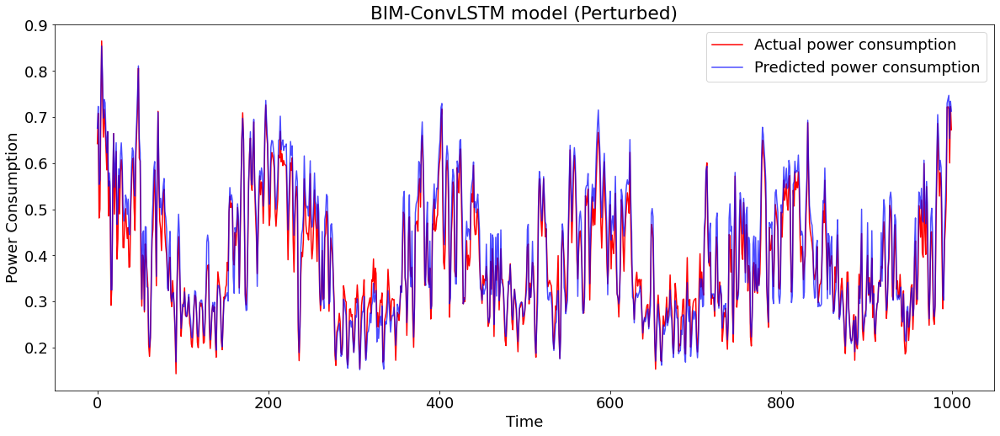

In [111]:
convlstm_bim_predictions=get_result(bim_convlstm, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, "BIM-ConvLSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

In [112]:
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_3 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_11 (Flatten)        (None, 1408)              0         
                                                                 
 dense_31 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
254/254 [==============================] - 4s 5ms/step - loss: 0.0162
Epoch 2/10
254/254 [==============================] - 1s 5ms/step - loss: 0.0028
Epoch 3/10
254/254 [==============================] - 1s 5ms/step - loss: 0.0023
Epoch 4/10
254/254 [==============================] - 1s 5ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.9548606614714878
RMSE: 0.027083560770903105


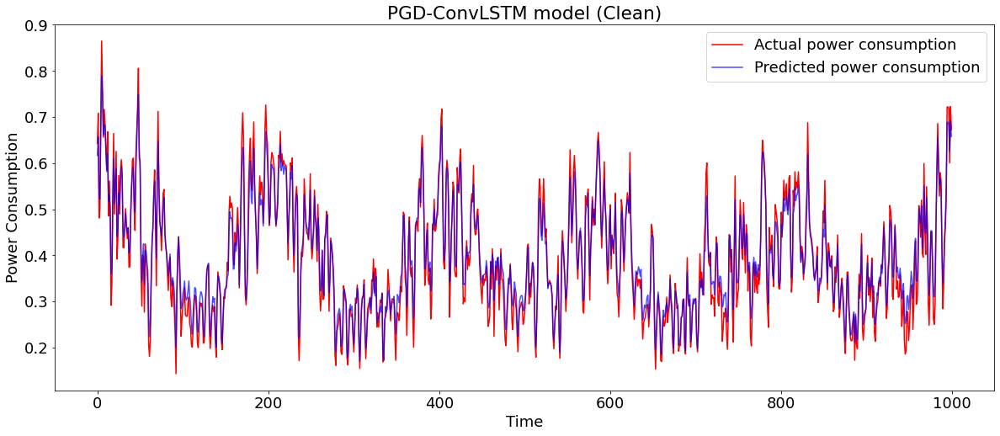

In [113]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, "PGD-ConvLSTM model (Clean)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")

Model - ConvLSTM:
R^2 Score: 0.8646423743587545
RMSE: 0.04689964252676415


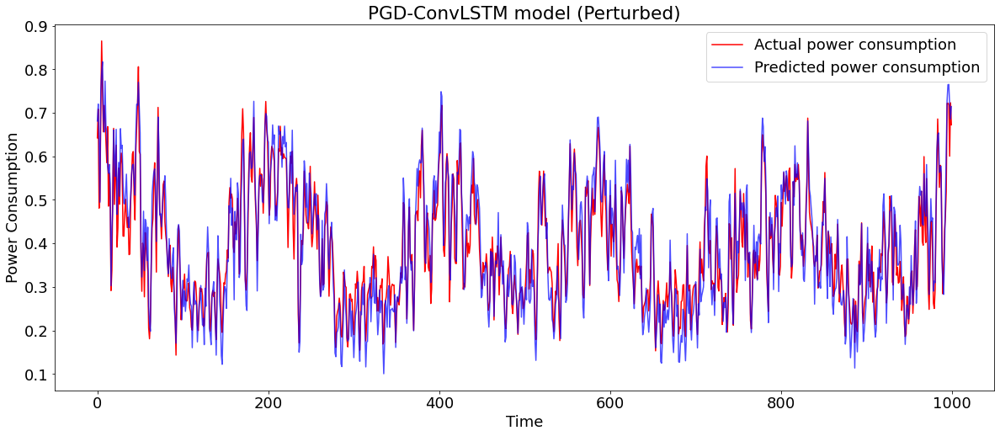

In [114]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, "PGD-ConvLSTM model (Perturbed)", xLabel="Time", yLabel="Power Consumption", realLabel="Actual power consumption", predictedLabel="Predicted power consumption")